# Lab 3

In [5]:
import numpy as np
import matplotlib.pyplot as plt

## Helpers

In [6]:
def plot_signal(time, signal, sampling_rate, title):
    plt.figure(figsize=(25, 25))
    plt.subplot(3, 1, 1)
    plt.plot(time, signal)
    plt.title(title)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude (V)')

    spectrum = np.fft.fft(signal)
    freq_x = np.fft.fftfreq(len(signal), 1 / sampling_rate)
    positive_freq_indices = np.where(freq_x >= 0)
    spectrum = spectrum[positive_freq_indices]
    freq_x = freq_x[positive_freq_indices]
    amplitude_spectrum = np.abs(spectrum)/len(spectrum)


    plt.subplot(3, 1, 2)
    plt.stem(freq_x, amplitude_spectrum)
    plt.title(f'Amplitude Spectrum - {title}')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Amplitude (V)')

In [7]:
def generate_sinusoidal_signal(frequency, T, sampling_rate, amplitude=1, endpoint=False):
    time = np.linspace(0, T, int(sampling_rate * T), endpoint=endpoint)
    signal = amplitude * np.sin(2 * np.pi * frequency * time)
    return time, signal

# Task 1

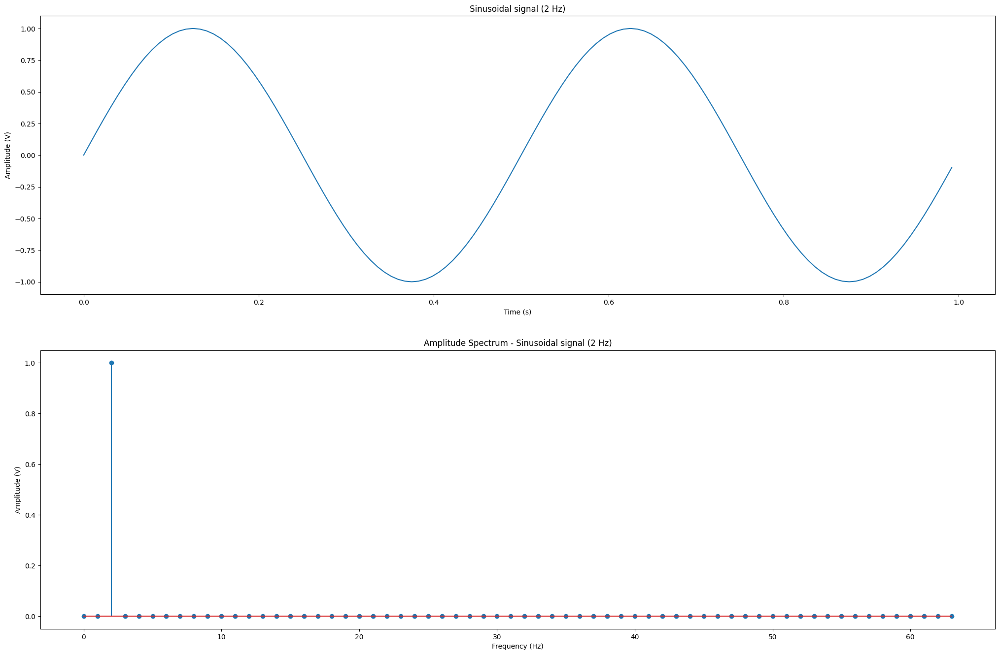

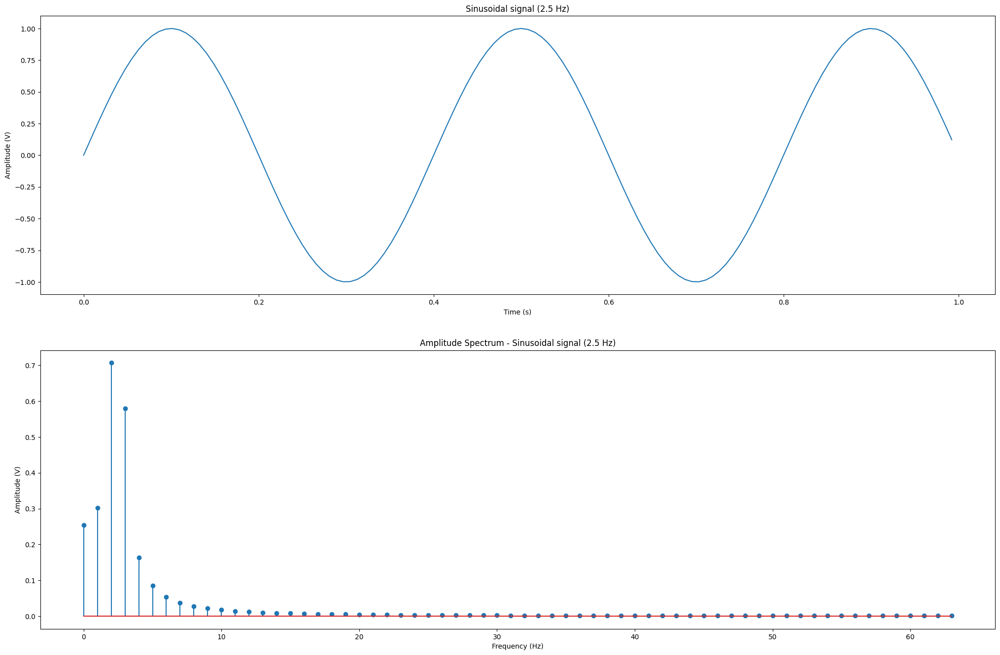

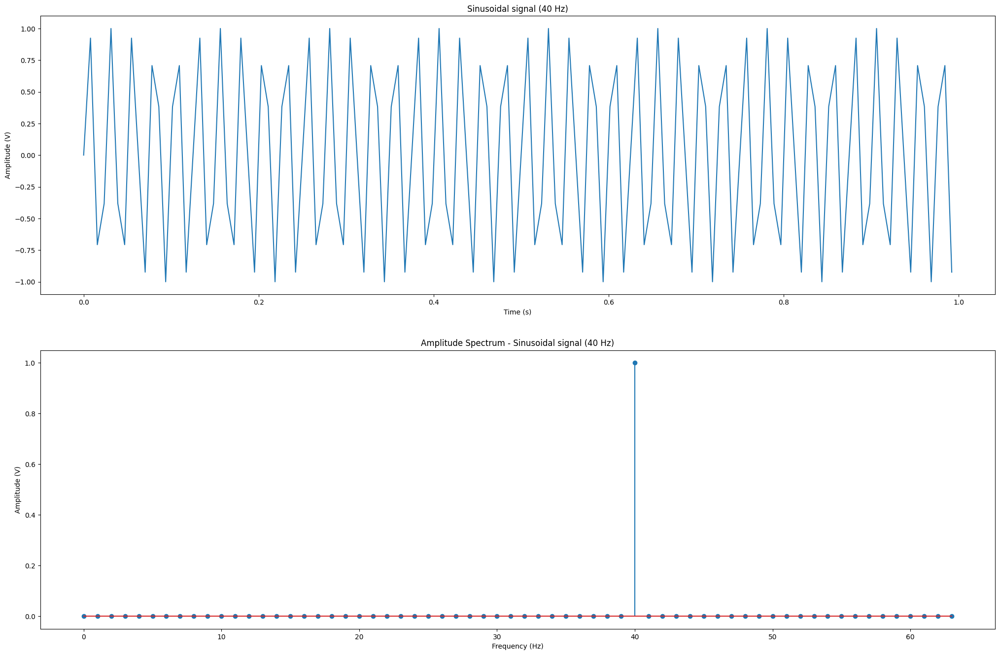

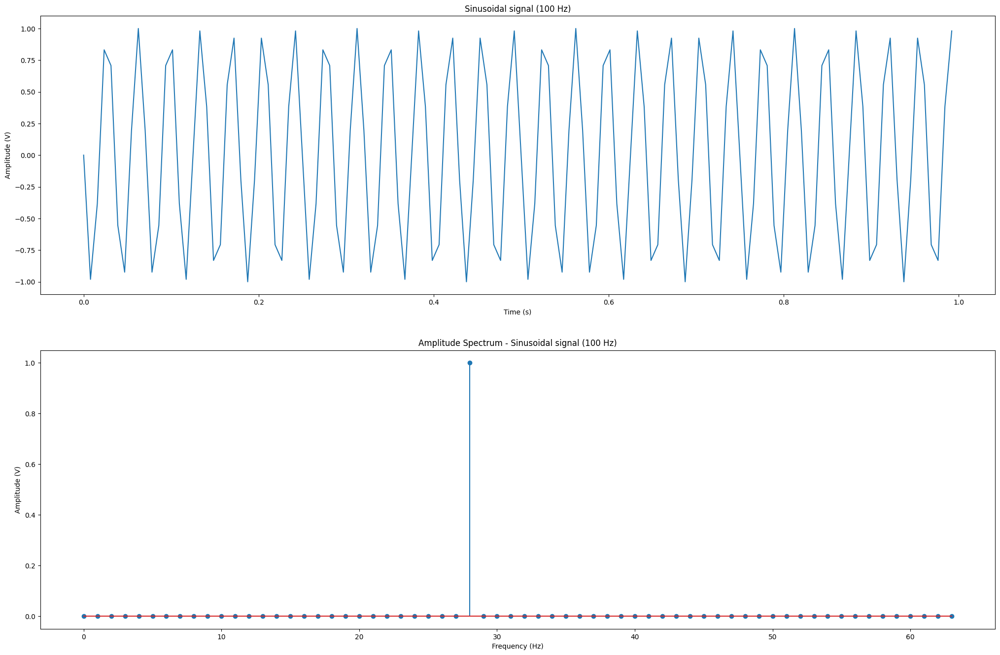

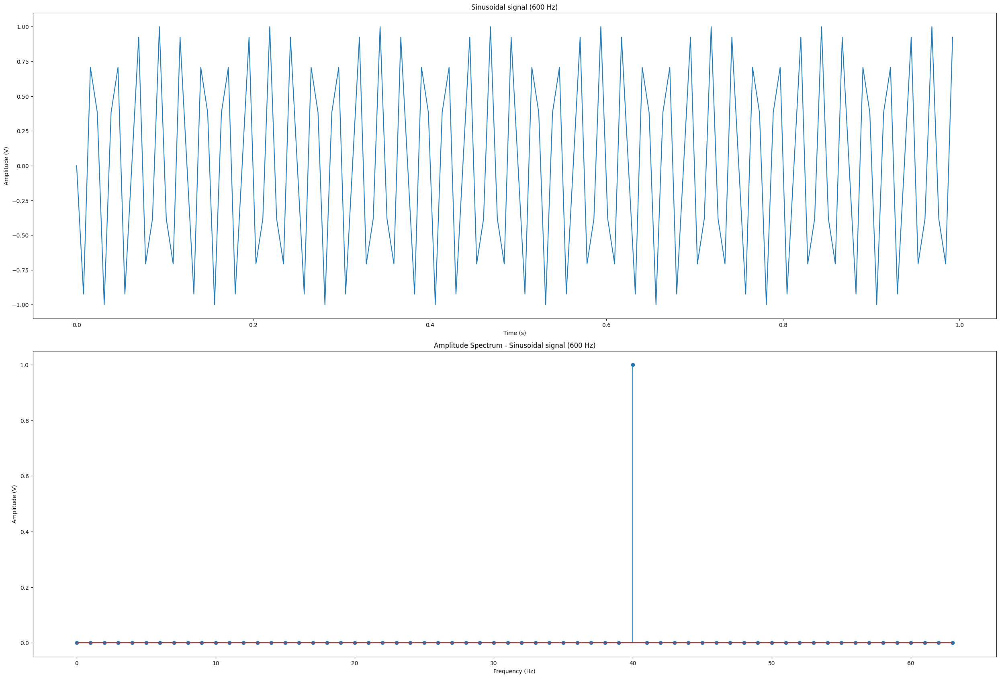

In [8]:
fs = 128
T = 1

frequencies = [2, 2.5, 40, 100, 600]

for freq in frequencies:
    time, signal = generate_sinusoidal_signal(freq, T, fs)
    
    plot_signal(time, signal, fs, f"Sinusoidal signal ({freq} Hz)")

plt.tight_layout()
plt.show()

### Signals at 2 Hz and 40 Hz:
- Integer Number of Cycles: Both the 2 Hz and 40 Hz signals complete an integer number of cycles within the 1-second time frame. Specifically, the 2 Hz signal completes exactly 2 cycles, and the 40 Hz signal completes exactly 40 cycles.
- Spectral Representation: Because the signals are periodic within the sampled interval, the Discrete Fourier Transform (DFT) accurately captures their frequency content without introducing artifacts. The amplitude spectra display sharp peaks at the respective frequencies of 2 Hz and 40 Hz.

### Signal at 2.5 Hz:
- Non-Integer Number of Cycles: The 2.5 Hz signal completes 2.5 cycles in 1 second, resulting in a non-integer number of cycles within the sampled interval.
- Spectral Leakage:
    - Boundary Discontinuity: The DFT assumes the signal is periodic over the interval. However, because the 2.5 Hz signal does not complete an integer number of cycles, there is a discontinuity at the boundaries when the signal is periodically extended.
    - Energy Spread: This discontinuity causes spectral leakage, where the signal's energy spreads into adjacent frequency bins rather than being confined to a single bin. Consequently, the amplitude spectrum shows a broadened peak around 2.5 Hz instead of a sharp spike.

### Signals at 100 Hz and 600 Hz:
- Sampling Rate Limitation: The sampling rate is 128 Hz, yielding a Nyquist frequency of 64 Hz (half of the sampling rate). Frequencies above 64 Hz cannot be accurately represented and will undergo aliasing.
- Aliasing Effect: The aliased frequency $f_a$ can be calculated using $f_a = \left| f - k \cdot f_s \right|$, where:
     - $f_s$: sampling frequency
     - $k$: integer that brings $f_a$ within Nyquist interval $[0, f_s/2]$.
     
     Thus, for 100 Hz $f_a = \left| 100 Hz - 128 Hz \right| = 2 Hz$, and for 600Hz $f_a = \left| 600 Hz - 5 \cdot 128 Hz \right| = 40 Hz$

### 1.1

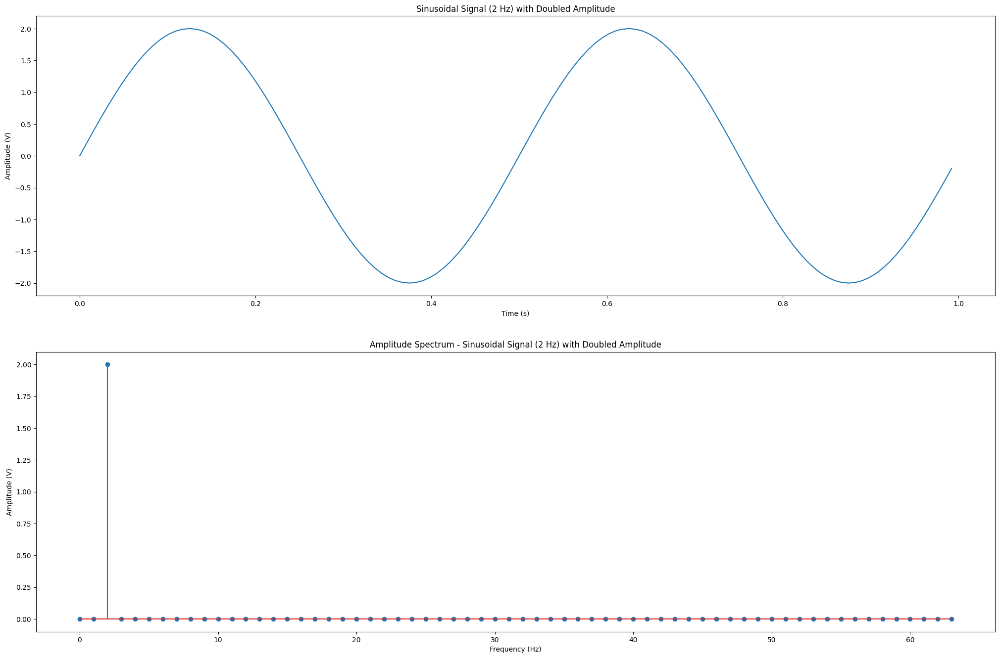

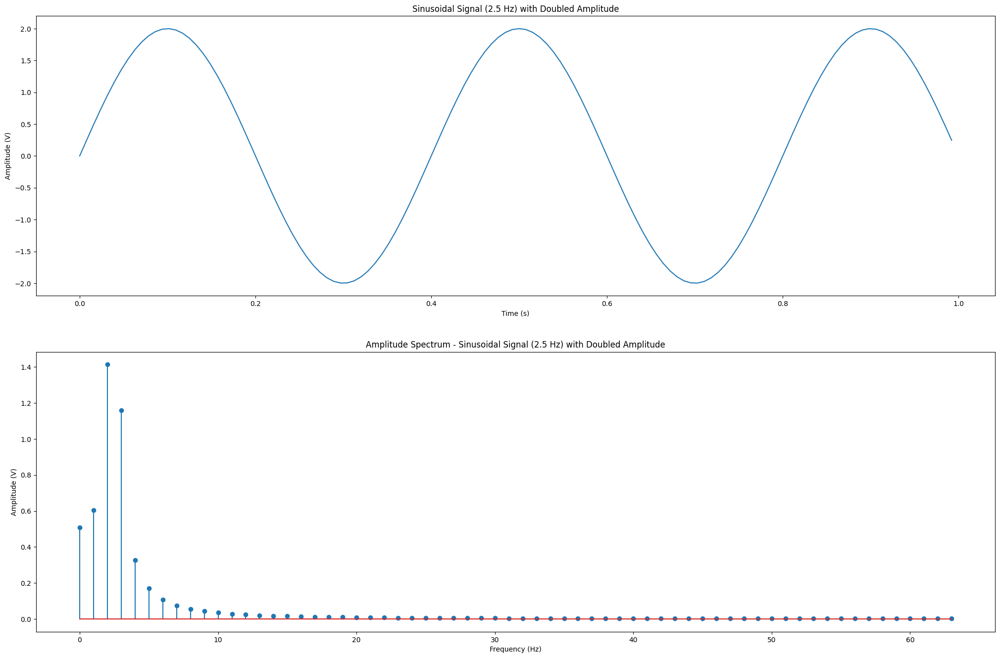

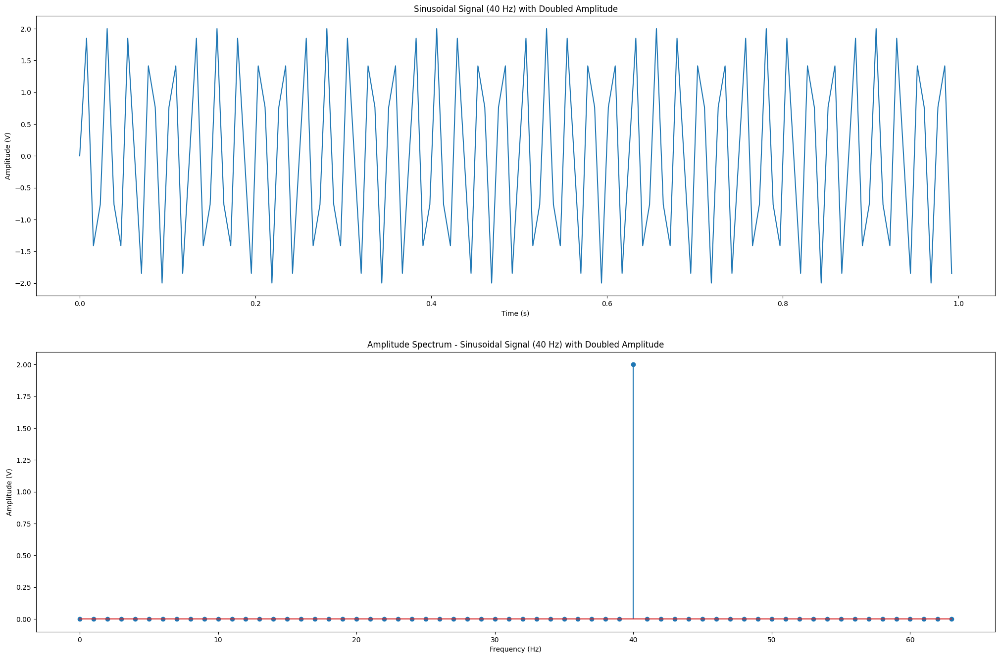

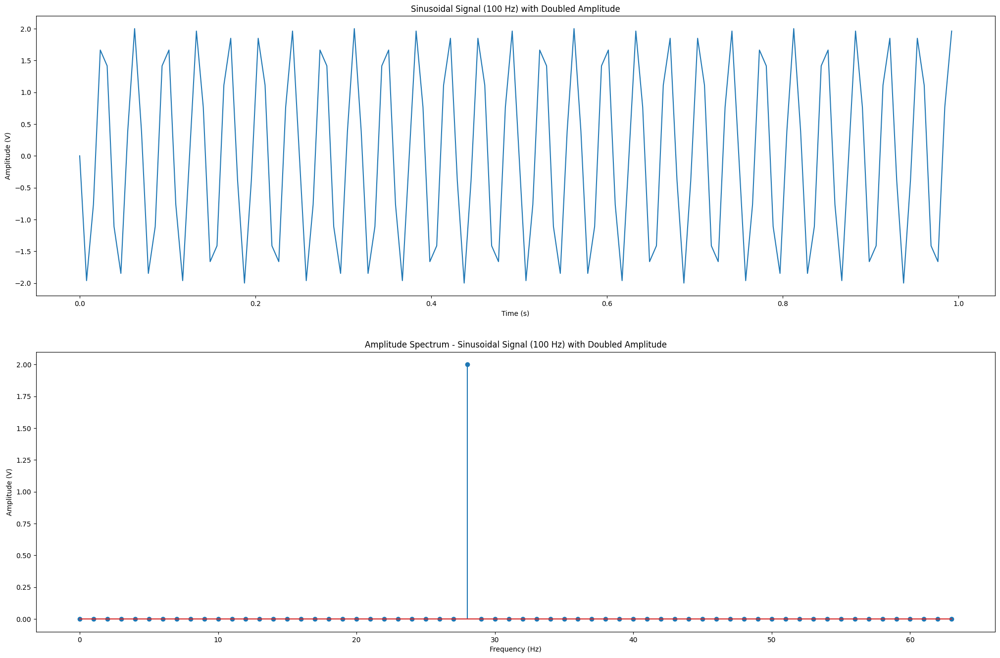

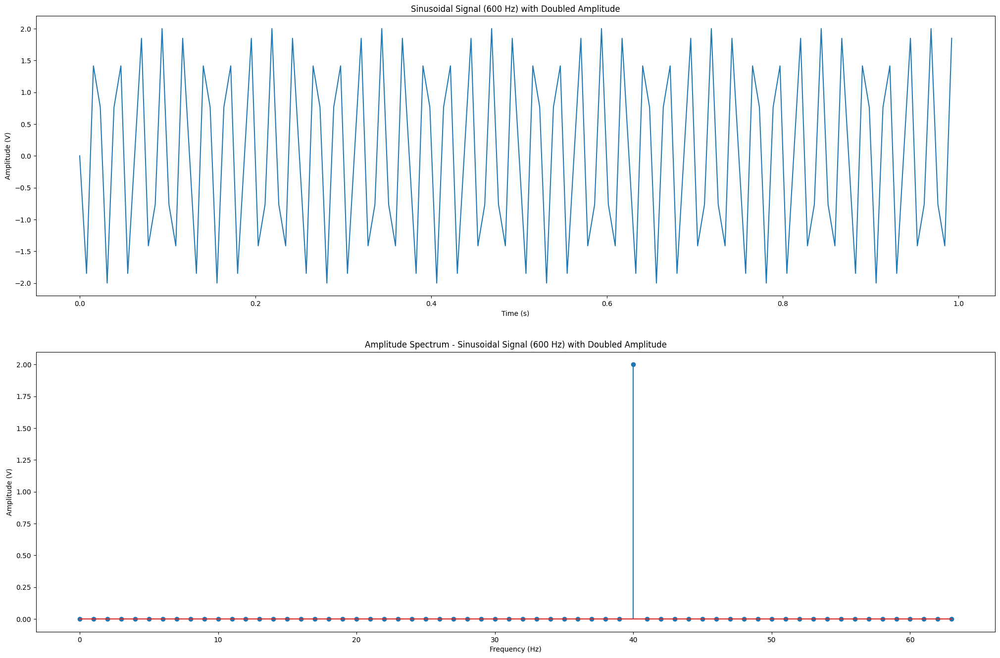

In [9]:
frequencies = [2, 2.5, 40, 100, 600]

for freq in frequencies:
    time, signal = generate_sinusoidal_signal(freq, T, fs, amplitude=2)  # Amplitude doubled
    plot_signal(time, signal, fs, f"Sinusoidal Signal ({freq} Hz) with Doubled Amplitude")

### 1.2

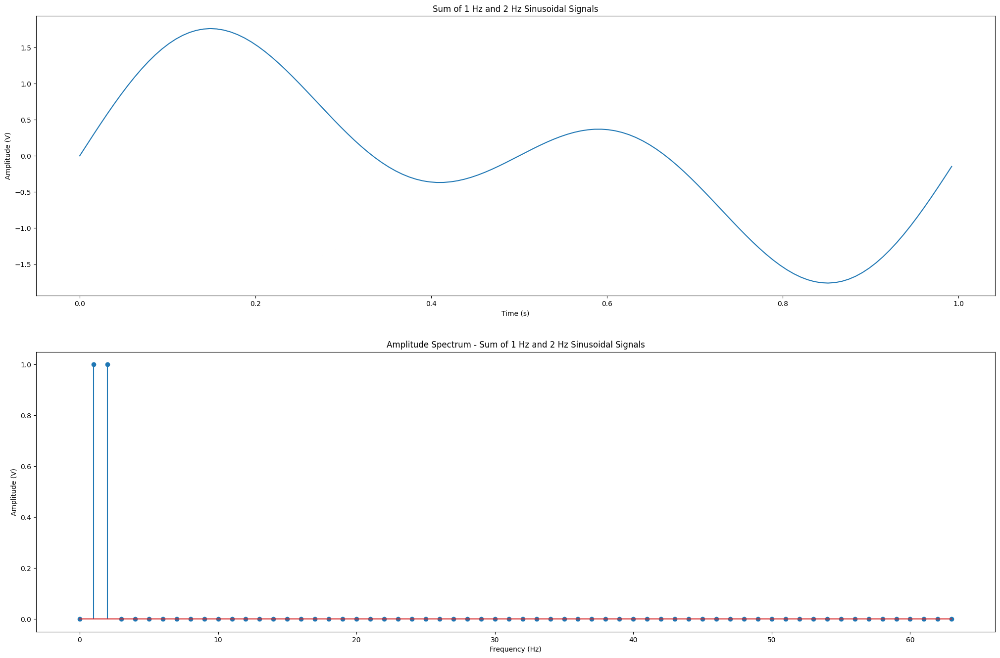

In [10]:
time, signal1 = generate_sinusoidal_signal(1, T, fs)
_, signal2 = generate_sinusoidal_signal(2, T, fs)

# Sum the signals
combined_signal = signal1 + signal2

# Plot the combined signal and its spectrum
plot_signal(time, combined_signal, fs, "Sum of 1 Hz and 2 Hz Sinusoidal Signals")

### 1.3

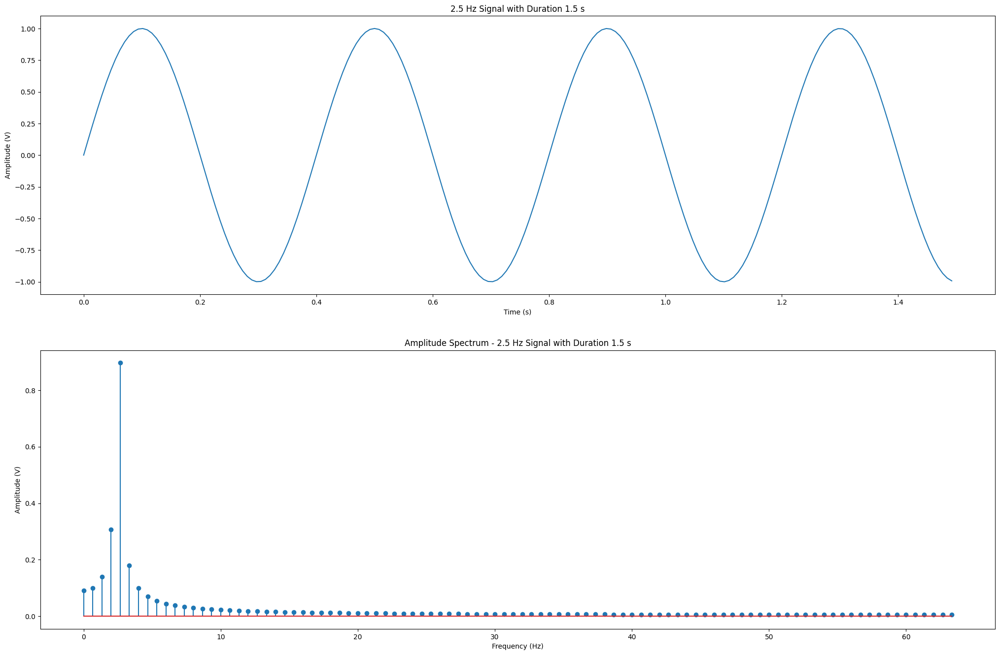

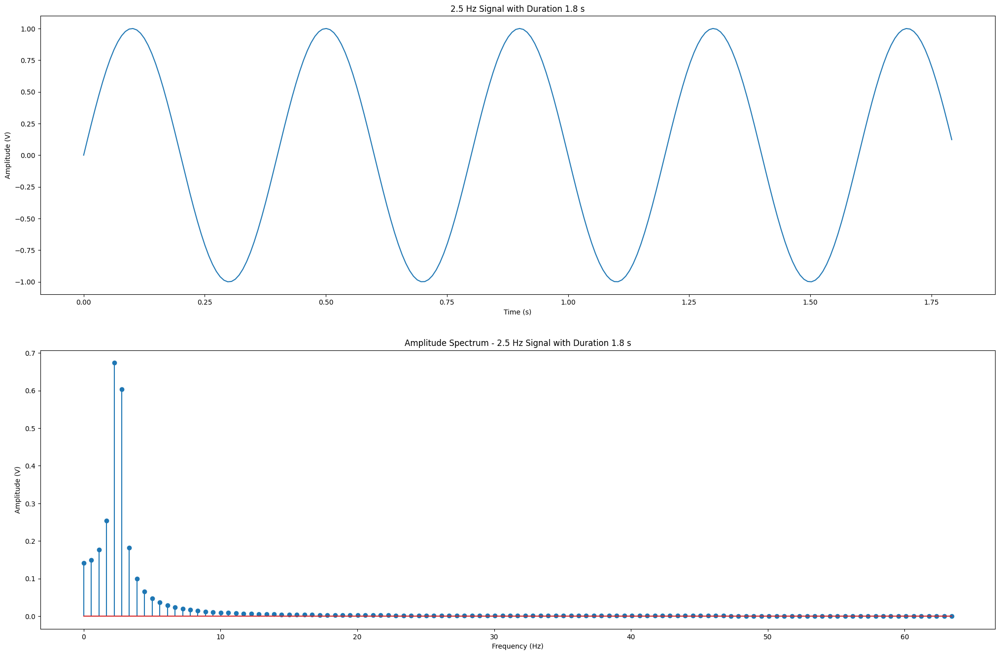

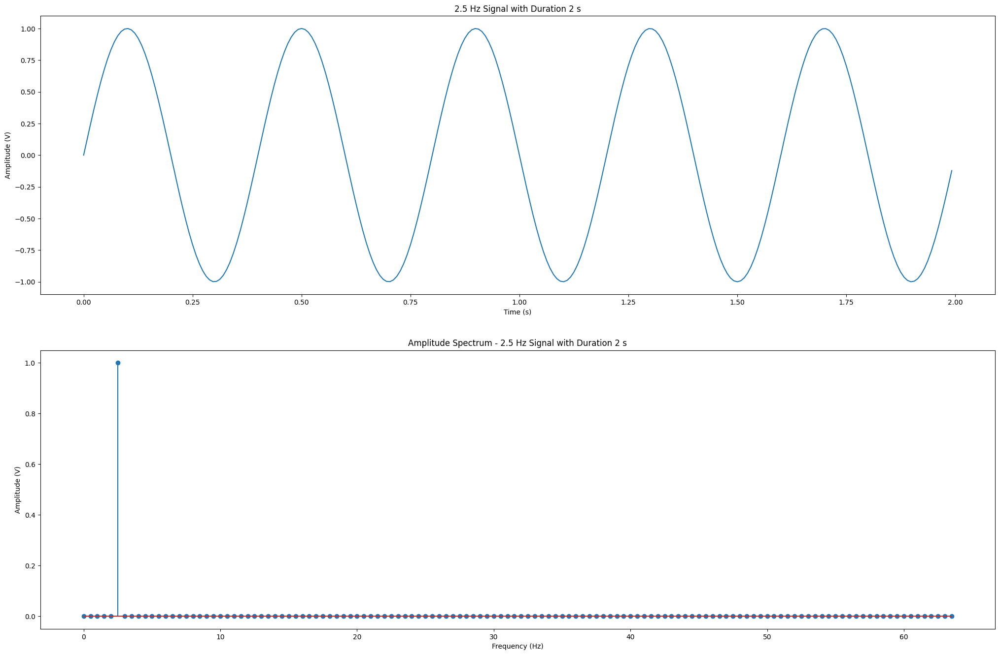

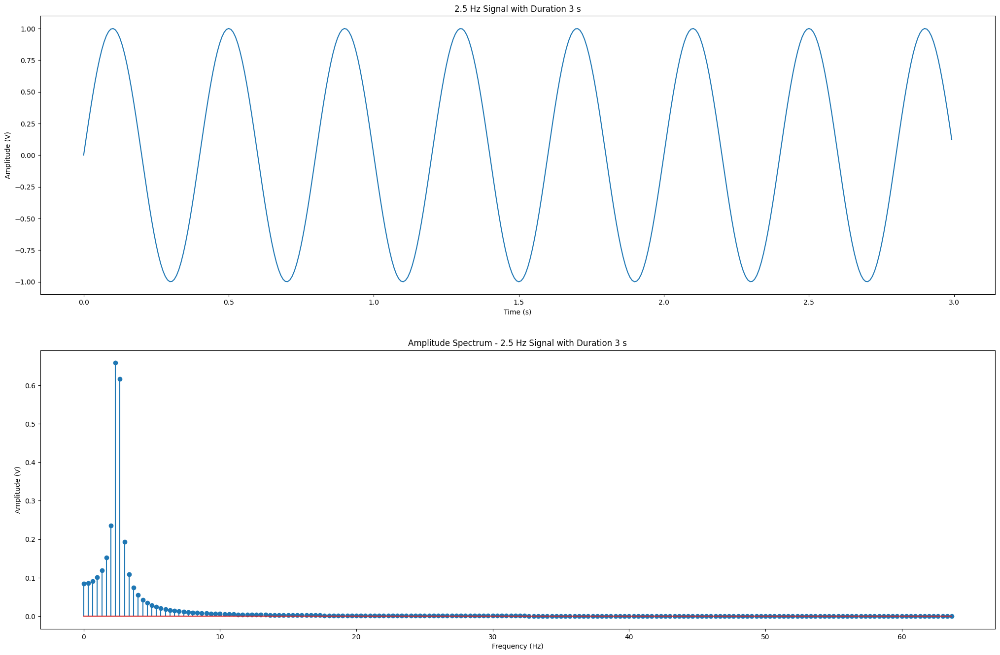

In [11]:
durations = [1.5, 1.8, 2, 3]

for T_extended in durations:
    time, signal = generate_sinusoidal_signal(2.5, T_extended, fs)
    plot_signal(time, signal, fs, f"2.5 Hz Signal with Duration {T_extended} s")


## Task 2

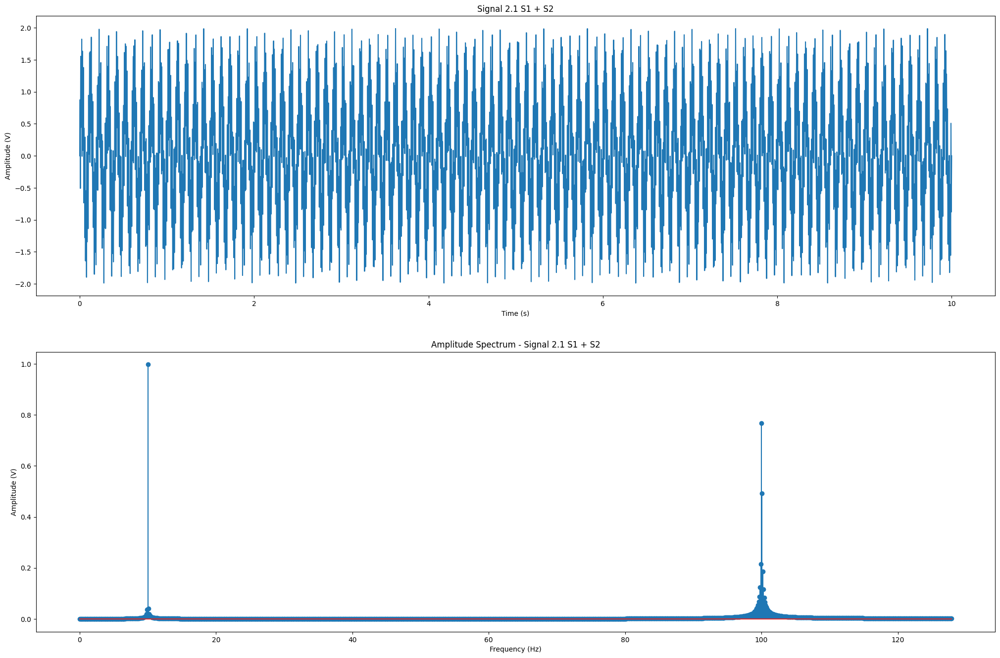

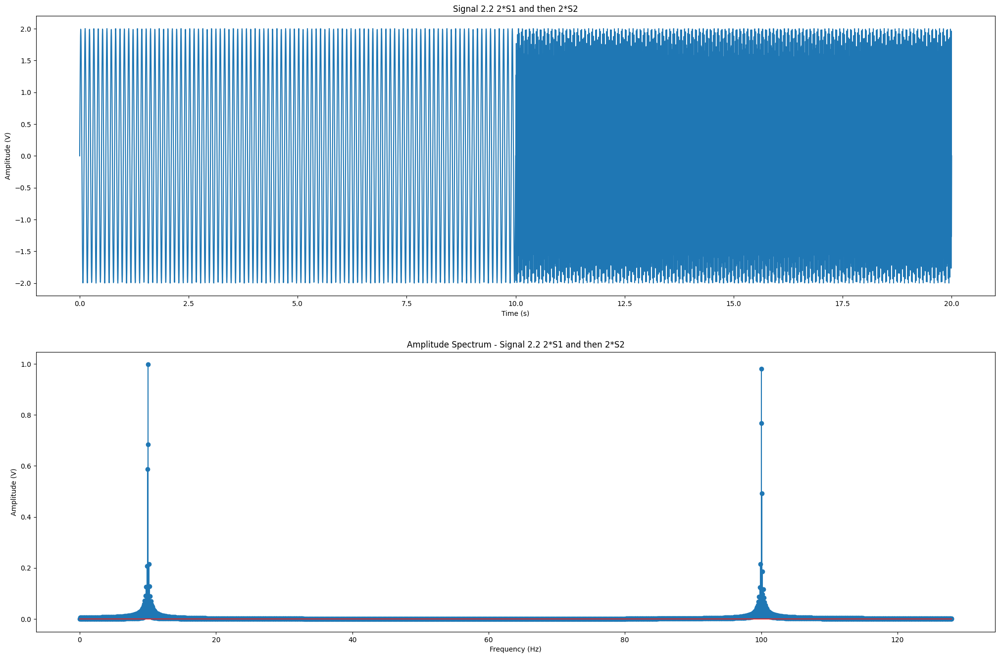

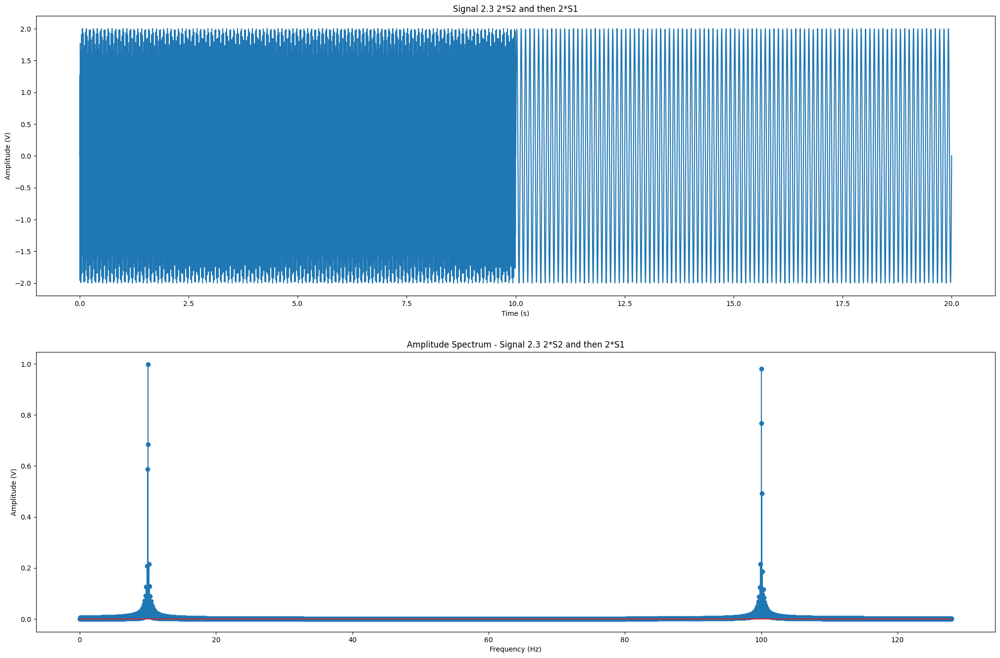

In [12]:

sampling_rate = 256  
T = 10  
freq1 = 10  
freq2 = 100 

time_10s = np.linspace(0, T, int(sampling_rate * T))
time_20s = np.linspace(0, 2 * T, int(sampling_rate * 2 * T))


S1 = np.sin(2 * np.pi * freq1 * time_10s)
S2 = np.sin(2 * np.pi * freq2 * time_10s)


signal_2_1 = S1 + S2
signal_2_2 = np.concatenate([2 * S1, 2 * S2])
signal_2_3 = np.concatenate([2 * S2, 2 * S1])




plot_signal(time_10s, signal_2_1, sampling_rate, f"Signal 2.1 S1 + S2")


plot_signal(time_20s, signal_2_2, sampling_rate, f"Signal 2.2 2*S1 and then 2*S2")


plot_signal(time_20s, signal_2_3, sampling_rate, f"Signal 2.3 2*S2 and then 2*S1")




### Summary:
2.1) Here a signal is a sum of two signals and in spectral domain we can see two clear soikes at 10Hz and 100Hz

2.2, 2.3) Here is a signal contains both signals one by one. we can see spikes at 10Hz and 100Hz, meaning they are present in the signal, however we do not have any information about time-domain: which signal comes first, so spectrum in 2.2 and 2.3 are the same, though the signals are different in time-domain.

## Task 3

In [13]:
def zero_gap(signal, gap_start, num_samples, sampling_rate):
    start = int(gap_start * sampling_rate)
    end = start + num_samples
    zeros = np.zeros(num_samples)
    signal_with_gap = np.concatenate((signal[:start], zeros, signal[end:]))
    return signal_with_gap

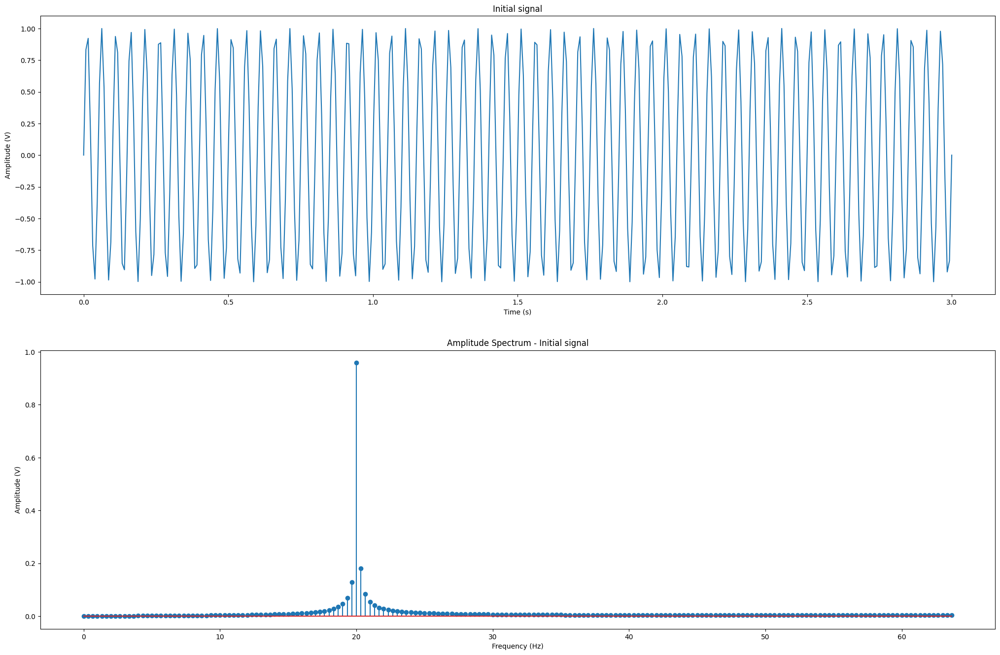

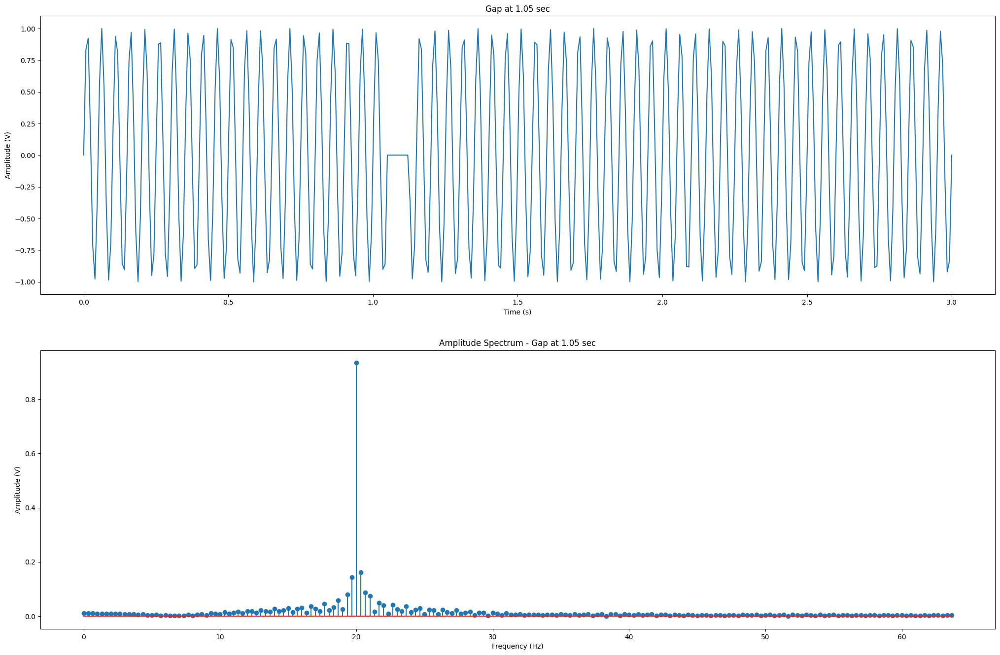

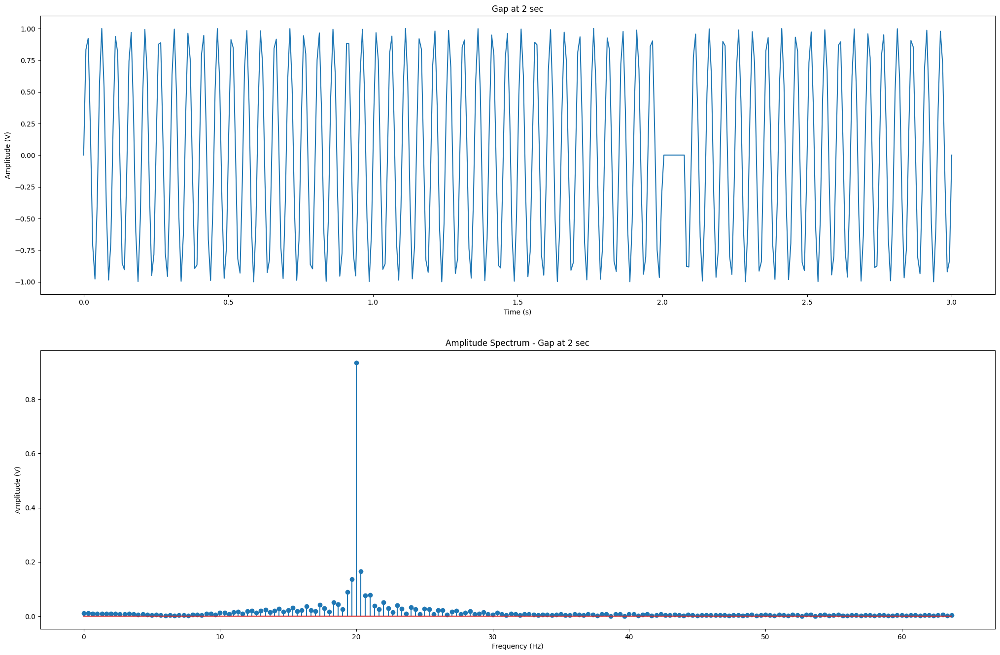

In [14]:
sampling_rate = 128
T = 3
frequency = 20
num_gap = 10

time, signal = generate_sinusoidal_signal(frequency, T, sampling_rate, endpoint=True)

plot_signal(time, signal, sampling_rate, "Initial signal")

gap_1 = zero_gap(signal, 1.05, num_gap, sampling_rate)
plot_signal(time, gap_1, sampling_rate, "Gap at 1.05 sec")


gap_1 = zero_gap(signal, 2, num_gap, sampling_rate)
plot_signal(time, gap_1, sampling_rate, "Gap at 2 sec")


We see that at the initial signal we have a clear spike at 20 Hz. However, when we insert a gap, it affects the spectrum, causing visible fluctuations to the spectrum, which are centered around our main frequency. Moreover, the location of the gap does not affect the spectral domain, therefore we cannot conclude the exact location of the gap in the signal

### Task 4

In [15]:
def generate_rectangular_pulse_signal(frequency, T, sampling_rate):
    time = np.linspace(0, T, int(sampling_rate * T))
    return time, np.sign(np.sin(2 * np.pi * frequency * time))

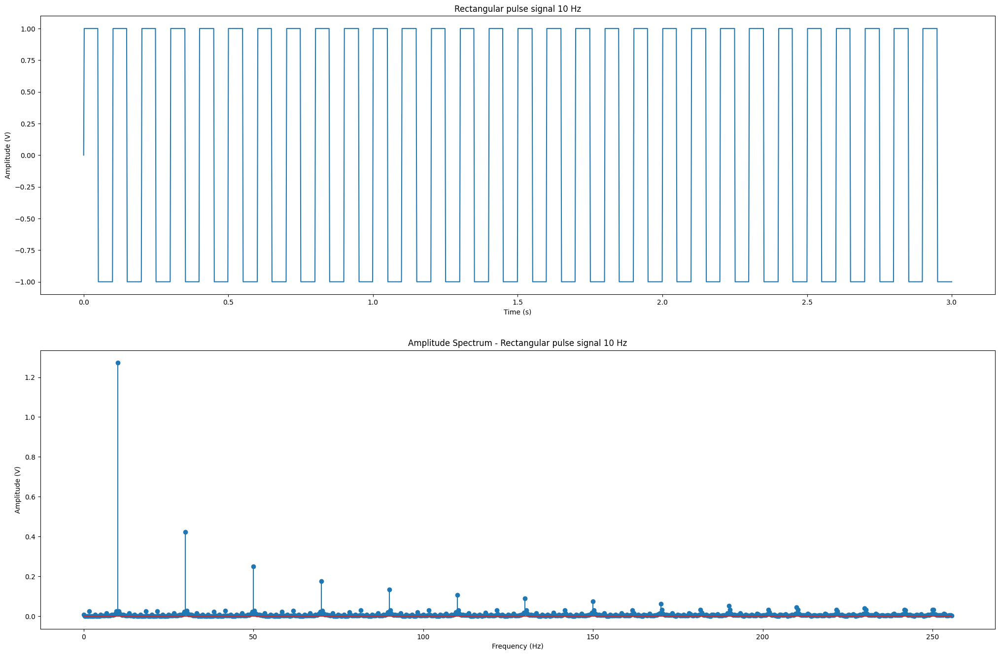

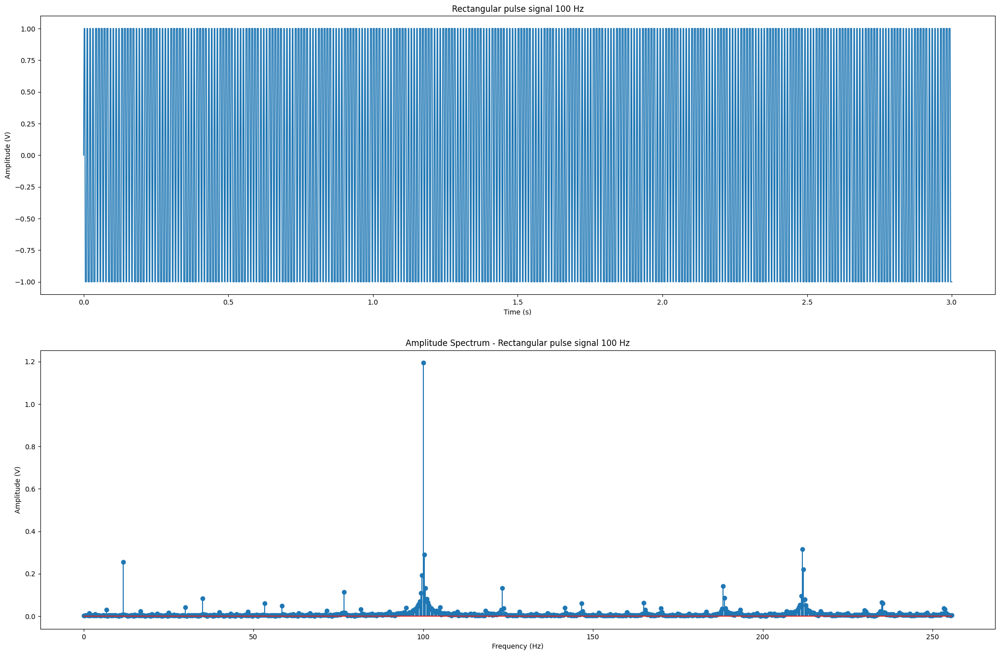

In [16]:
sampling_rate = 512  
T = 3  
frequencies = [10, 100]

for freq in frequencies:
    time, signal = generate_rectangular_pulse_signal(freq, T, sampling_rate)
    plot_signal(time, signal, sampling_rate, f"Rectangular pulse signal {freq} Hz")


- **Fundamental Frequency and Harmonics:**
    - For rectangular pulse signals (square waves) with a 50% duty cycle, the amplitude spectrum consists of the fundamental frequency and its odd harmonics.
    - For a fundamental frequency of **10 Hz**, the harmonics appear at **10 Hz, 30 Hz, 50 Hz, 70 Hz**, etc., up to the Nyquist frequency (half of the sampling rate, which is 256 Hz in your case).
    - Similarly, for **100 Hz**, the harmonics appear at **100 Hz, 300 Hz, 500 Hz**, etc., but due to the Nyquist limit, you will only observe harmonics up to 256 Hz.
- **Amplitude of Harmonics:**
    - The amplitudes of the harmonics decrease as the harmonic number increases.
    - Specifically, for a square wave with a 50% duty cycle, the amplitude of the nnn-th harmonic is proportional to $\frac{1}{n}n1$.
    - This means the fundamental frequency (first harmonic) has the highest amplitude, the third harmonic (n=3n = 3n=3) has an amplitude of $\frac{1}{3}31$ of the fundamental, the fifth harmonic (n=5n = 5n=5) has an amplitude of $\frac{1}{5}51$, and so on.
- **Energy of Harmonics:**
    - The energy at each harmonic is proportional to the square of its amplitude.
    - Therefore, the energy decreases proportionally to $\frac{1}{n^2}n21$.
    - So while the amplitude decreases as $\frac{1}{n}n1$, the energy decreases more rapidly.
- **Duty Cycle Influence:**
    - The duty cycle affects the harmonic content of the signal.
    - For a 50% duty cycle, only odd harmonics are present.
    - If the duty cycle is different, even harmonics may also appear, and the amplitudes will follow a different pattern.

### Task 5

In [17]:
def generate_single_pulse(T, pulse_duration, pulse_start=0):
    time = np.linspace(0, T, int(sampling_rate * T))
    signal = np.zeros_like(time)
    start_index = int(pulse_start * sampling_rate)
    end_index = int((pulse_start + pulse_duration) * sampling_rate)
    signal[start_index:end_index] = 1
    return time, signal

In [18]:
def plot_signal_spectrum_phase(time, signal, sampling_rate, title, freq_limit):

    spectrum = np.fft.fft(signal)
    freqs = np.fft.fftfreq(len(spectrum), 1/sampling_rate)
    amplitude_spectrum = np.abs(spectrum) / len(spectrum)
    phase_spectrum = np.angle(spectrum)

    plt.figure(figsize=(16, 8))
    plt.subplot(1, 2, 1)
    plt.plot(time, signal)
    
    plt.title(f'{title} - Signal')
    plt.xlabel('Time s')
    plt.ylabel('Amplitude')

    plt.subplot(1, 2, 2)
    plt.stem(freqs[:len(freqs)//2], amplitude_spectrum[:len(freqs)//2])
    plt.title(f'{title} - Amplitude Spectrum')
    plt.xlabel('Frequency Hz')
    plt.ylabel('Amplitude')
    plt.xlim(0, freq_limit)  

    plt.tight_layout()
    plt.show()

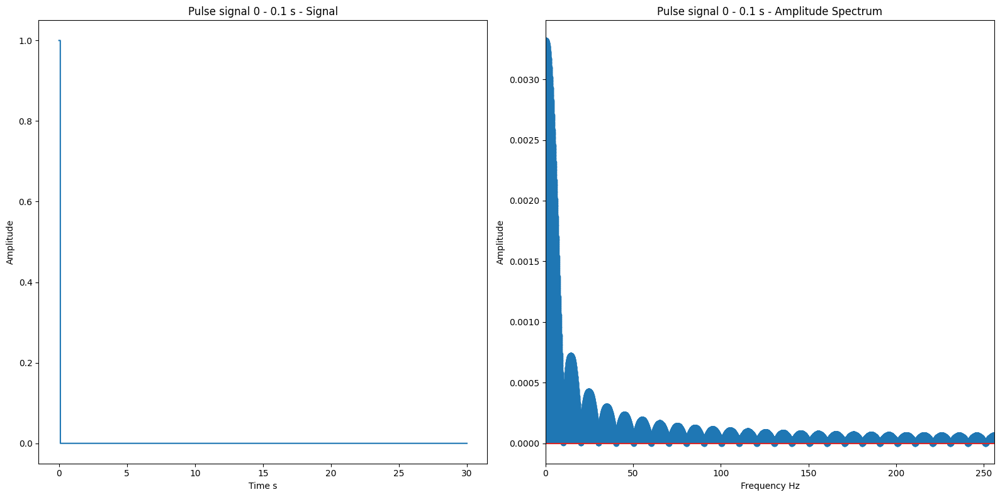

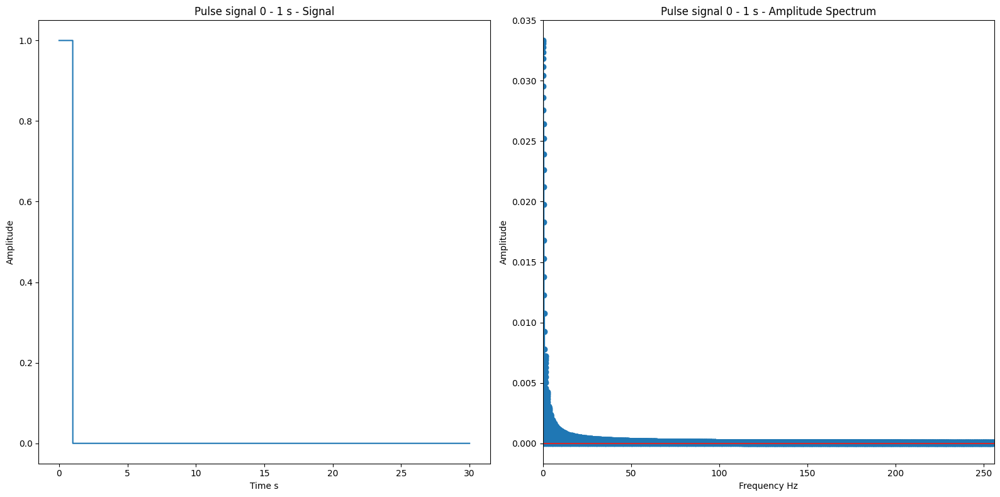

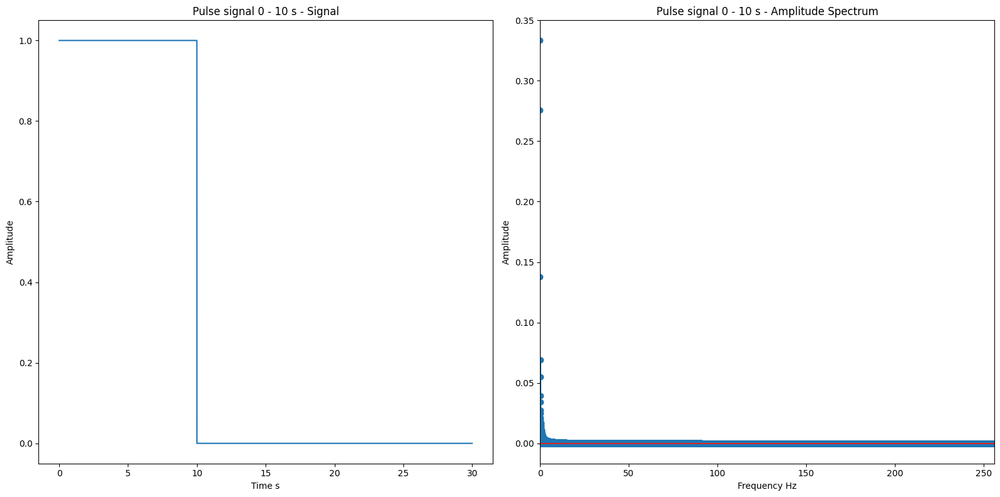

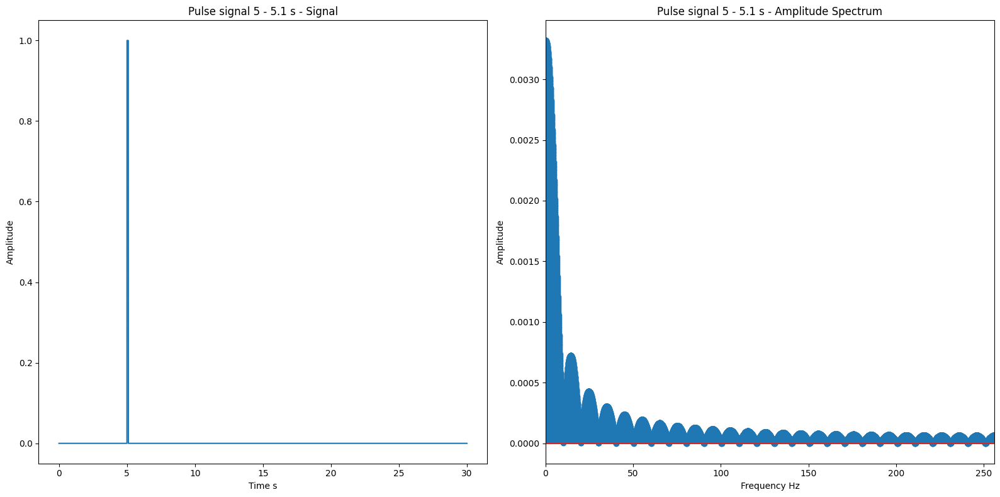

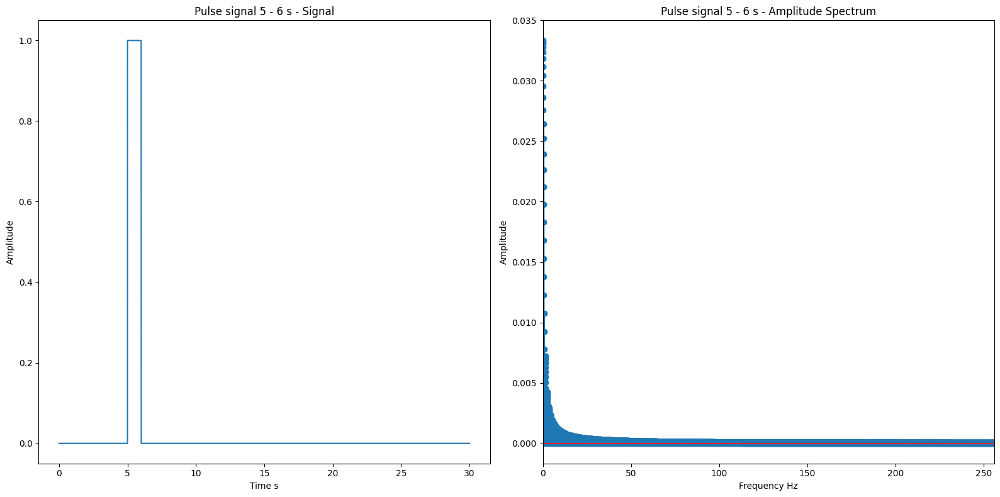

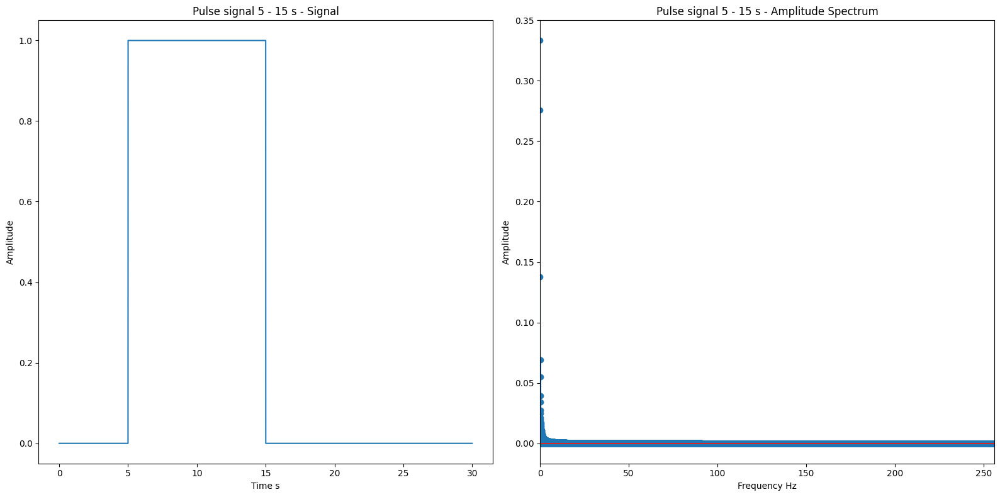

In [19]:
sampling_rate = 512
T = 30  
pulse_durations = [0.1, 1, 10]  
pulse_starts = [0, 5] 

for pulse_start in pulse_starts:
    for pulse_duration in pulse_durations:
        time, signal = generate_single_pulse(T, pulse_duration, pulse_start)
        title = f'Pulse signal {pulse_start} - {pulse_start + pulse_duration} s'
        plot_signal_spectrum_phase(time, signal, sampling_rate, title, freq_limit=256)  


As the pulse duration increases, the frequency content of the signal becomes more concentrated around 0 Hz because the width of the main lobe in the spectrum (a sinc function) is inversely proportional to the pulse duration. Therefore, longer pulses result in their fundamental frequency components tending toward 0 Hz, aligning with the relationship 
𝑓
≈
1
pulse duration
f≈ 
pulse duration
1
​
 .







## Task 6

In [20]:
# Function to generate a sinusoidal signal
def generate_sinusoidal_signal(frequency, amplitude, duration, sampling_rate):
    t = np.linspace(0, duration, int(sampling_rate * duration), endpoint=False)
    signal = amplitude * np.sin(2 * np.pi * frequency * t)
    return t, signal

# Function to add Gaussian noise to a signal
def add_noise(signal, mean, std_dev):
    noise = np.random.normal(mean, std_dev, size=signal.shape)
    noisy_signal = signal + noise
    return noisy_signal

# Function to plot the signal and its amplitude spectrum
def plot_signal_and_spectrum(time, signal, sampling_rate, title, freq_range=None):
    plt.figure(figsize=(12, 6))

    # Plot time-domain signal
    plt.subplot(2, 1, 1)
    plt.plot(time, signal)
    plt.title(f"{title} - Time Domain")
    plt.xlabel("Time [s]")
    plt.ylabel("Amplitude [V]")

    # Compute the FFT
    spectrum = np.fft.fft(signal)
    freq = np.fft.fftfreq(len(spectrum), d=1/sampling_rate)

    # Only take the positive frequencies
    positive_freqs = freq > 0
    freq = freq[positive_freqs]
    amplitude_spectrum = (2 / len(spectrum)) * np.abs(spectrum[positive_freqs])

    # Plot amplitude spectrum
    plt.subplot(2, 1, 2)
    plt.plot(freq, amplitude_spectrum)
    plt.title(f"{title} - Amplitude Spectrum")
    plt.xlabel("Frequency [Hz]")
    plt.ylabel("Amplitude")
    if freq_range:
        plt.xlim(freq_range)
    plt.tight_layout()
    plt.show()

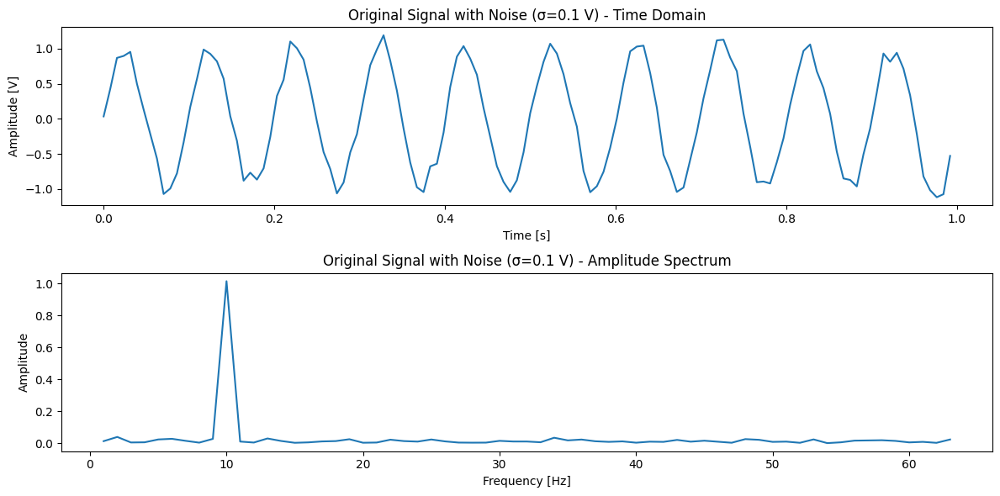

In [21]:
sampling_rate = 128  # Hz
frequency = 10       # Hz
amplitude = 1        # V
duration = 1         # s
mean_noise = 0       # V
std_dev_noise = 0.1  # V

# Generate the sinusoidal signal
time, signal = generate_sinusoidal_signal(frequency, amplitude, duration, sampling_rate)

# Add noise to the signal
noisy_signal = add_noise(signal, mean_noise, std_dev_noise)

# Plot the noisy signal and its amplitude spectrum
plot_signal_and_spectrum(time, noisy_signal, sampling_rate, "Original Signal with Noise (σ=0.1 V)")


### 6.1

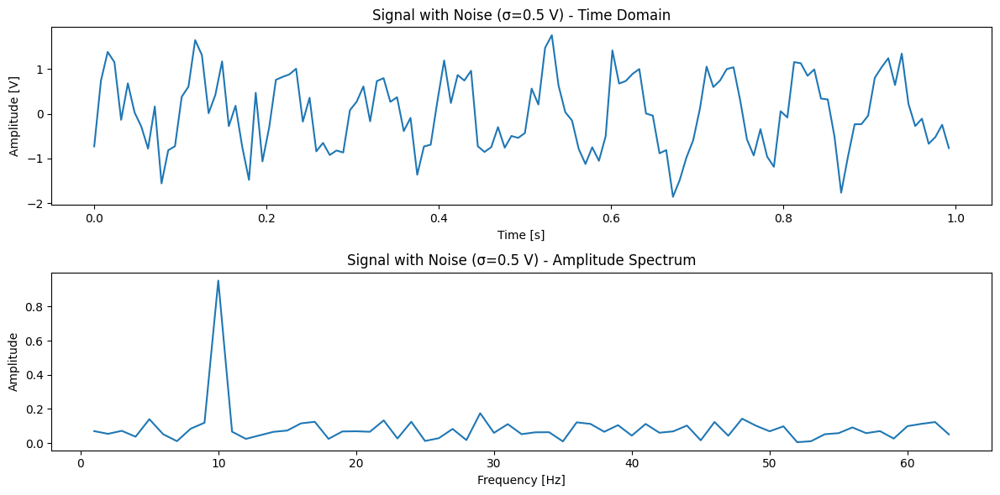

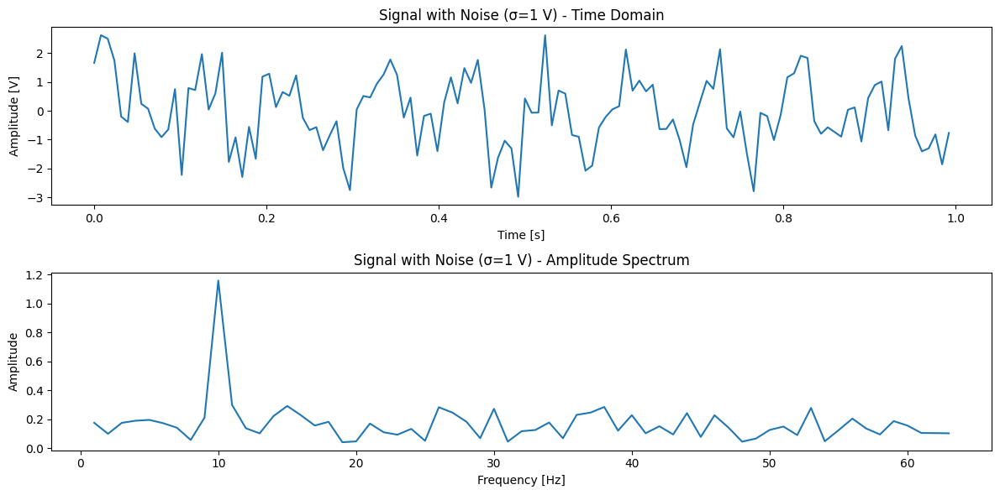

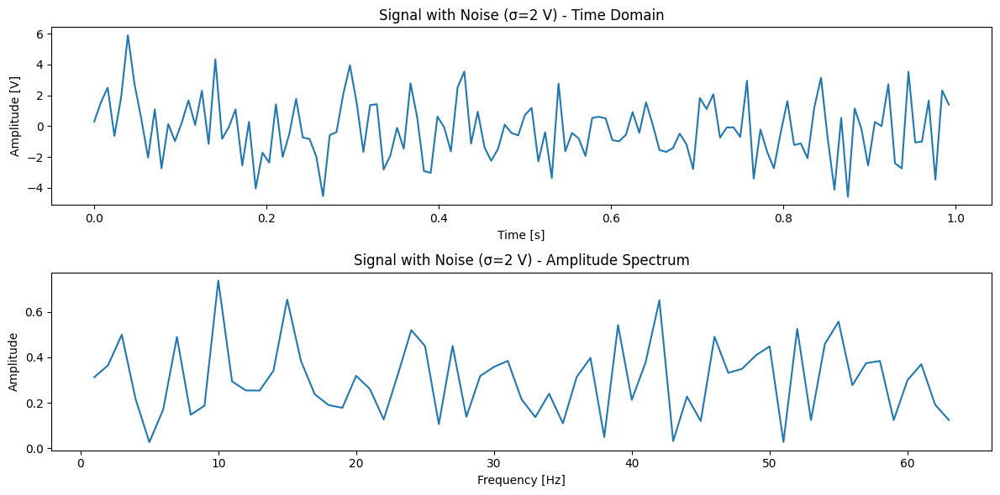

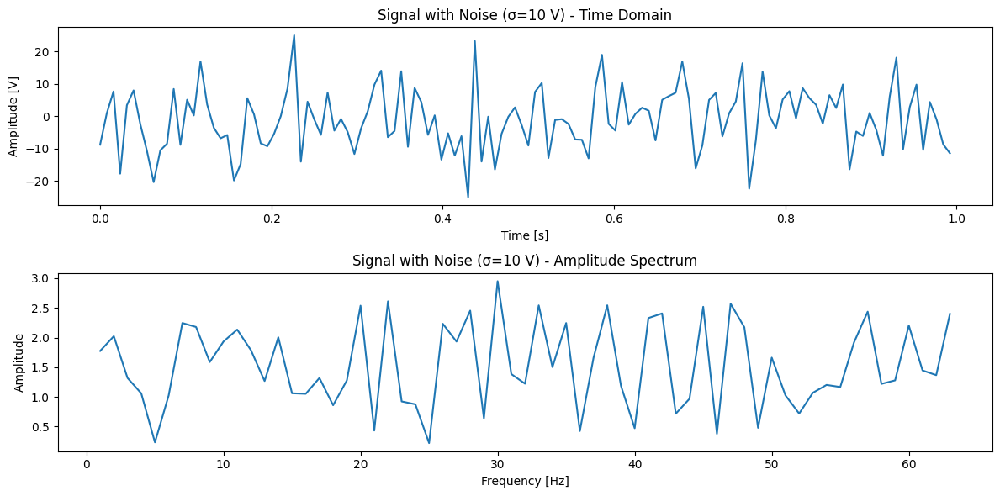

In [22]:
std_dev_values = [0.5, 1, 2, 10]  # V

for std_dev in std_dev_values:
    noisy_signal = add_noise(signal, mean_noise, std_dev)
    plot_signal_and_spectrum(time, noisy_signal, sampling_rate, f"Signal with Noise (σ={std_dev} V)")

### 6.2

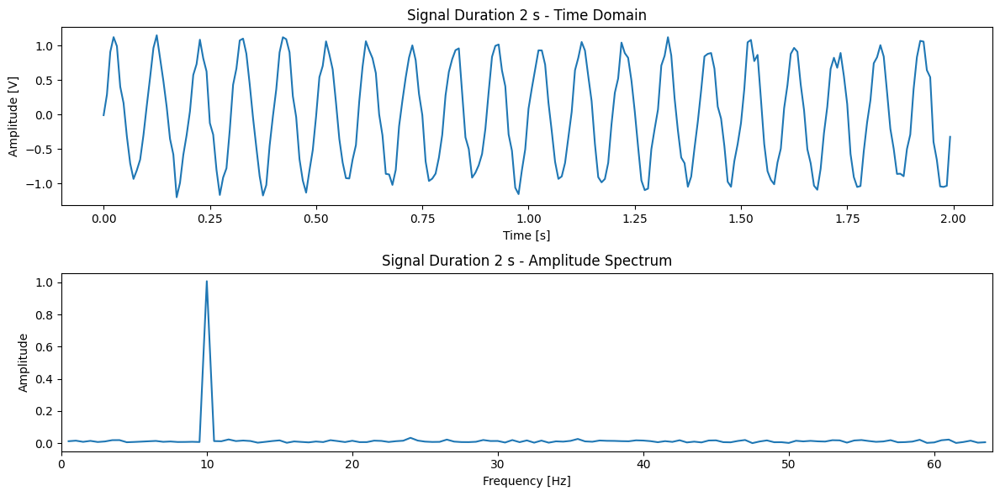

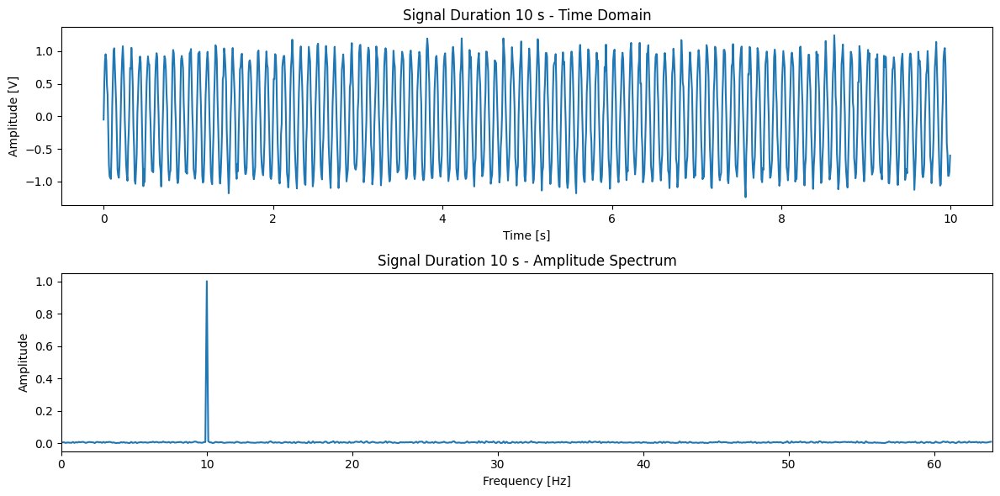

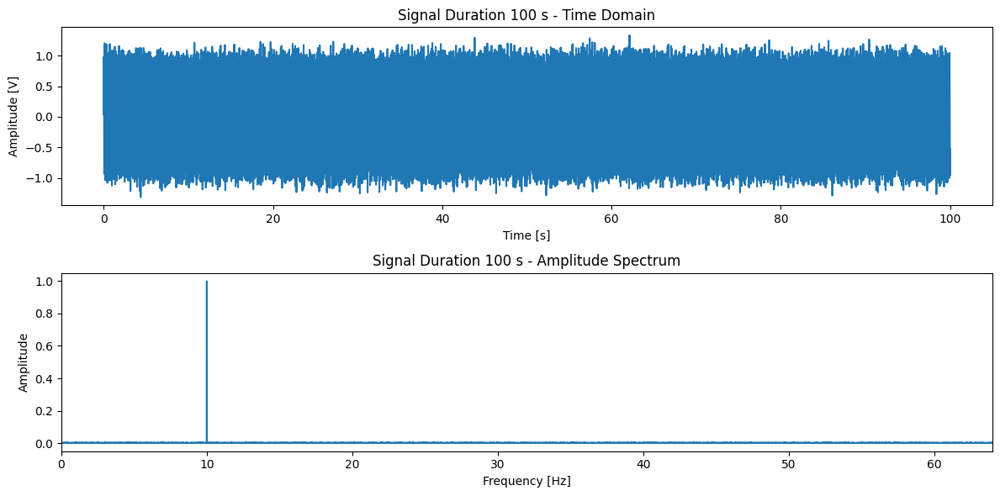

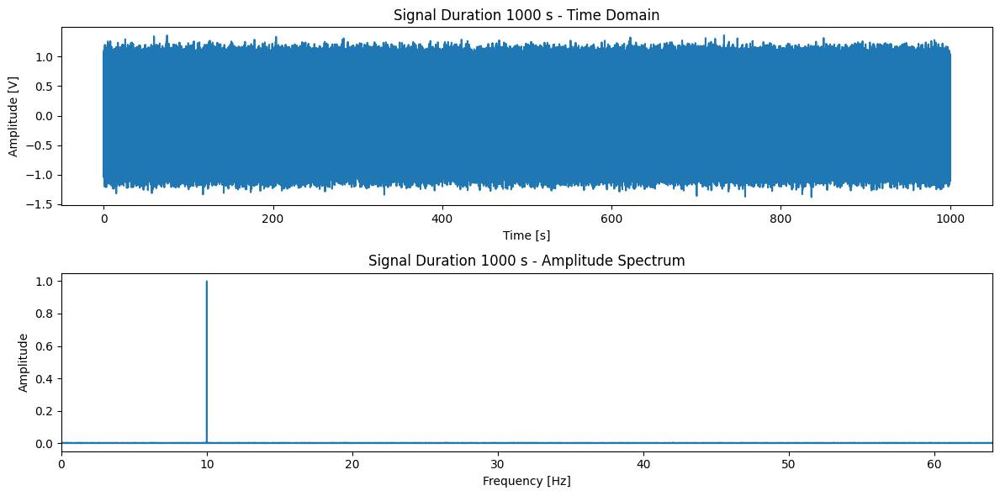

In [23]:
std_dev_noise = 0.1  # Reset to initial value
durations = [2, 10, 100, 1000]  # s

for duration in durations:
    time, signal = generate_sinusoidal_signal(frequency, amplitude, duration, sampling_rate)
    noisy_signal = add_noise(signal, mean_noise, std_dev_noise)
    plot_signal_and_spectrum(time, noisy_signal, sampling_rate, f"Signal Duration {duration} s", freq_range=(0, sampling_rate / 2))


### 6.3

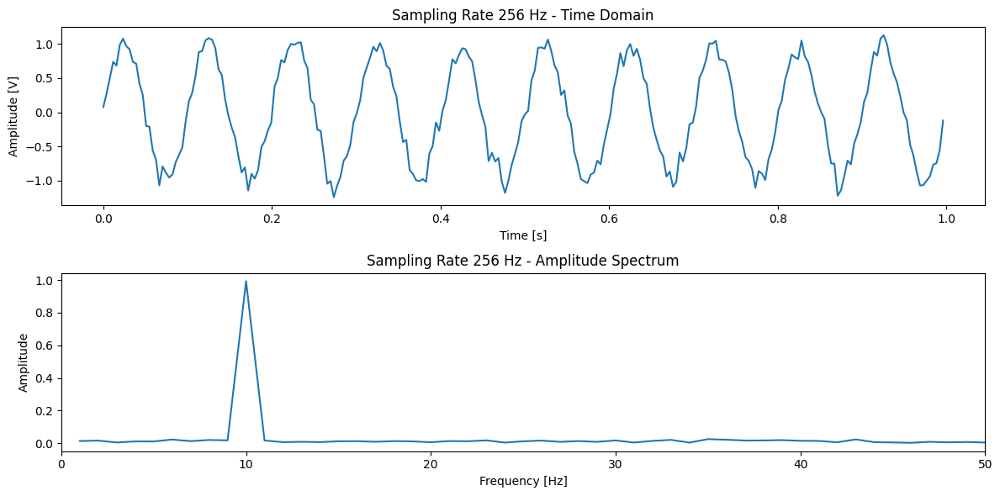

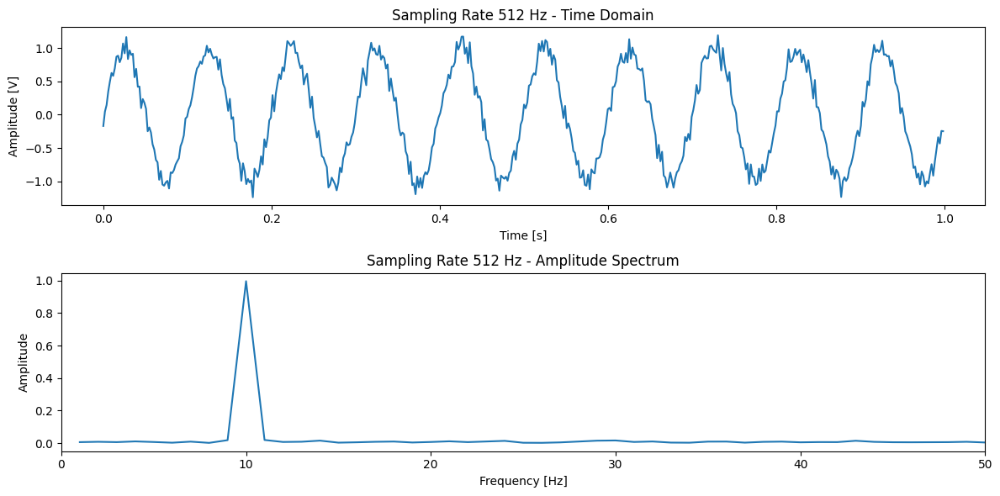

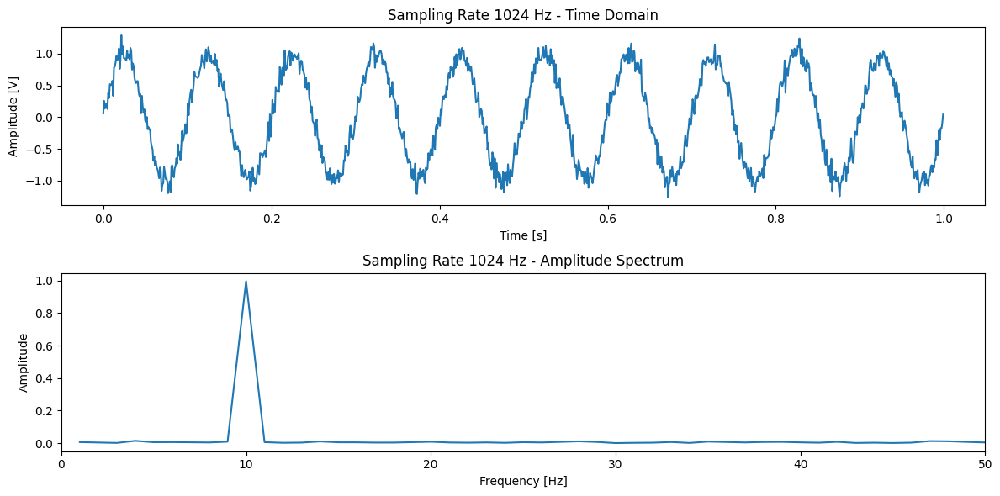

In [24]:
sampling_rates = [256, 512, 1024]  # Hz
duration = 1  # s

for fs in sampling_rates:
    time, signal = generate_sinusoidal_signal(frequency, amplitude, duration, fs)
    noisy_signal = add_noise(signal, mean_noise, std_dev_noise)
    plot_signal_and_spectrum(time, noisy_signal, fs, f"Sampling Rate {fs} Hz", freq_range=(0, 50))


### Summary

- 6.1: The noise floor (background level in the amplitude spectrum) rises with higher noise levels.
- 6.2: Frequency resolution improves with longer signal durations. The spectral peak at 10 Hz becomes sharper and more defined. The noise floor becomes smoother due to averaging over more data points.
- 6.3: Nothing changes because magnitude spectrum doesn't depend on $f_s$.


## Task 7

In [25]:
# Function to zero-pad the signal
def zero_pad_signal(signal, num_zeros):
    zero_padding = np.zeros(num_zeros)
    padded_signal = np.concatenate((signal, zero_padding))
    return padded_signal


# Function to plot the amplitude spectrum
def plot_amplitude_spectrum(signal, sampling_rate, title, freq_range=(0, 50)):
    N = len(signal)
    spectrum = np.fft.fft(signal)
    freq = np.fft.fftfreq(N, d=1 / sampling_rate)

    # Take only the positive frequencies
    positive_freqs = freq >= 0
    freq = freq[positive_freqs]
    amplitude_spectrum = (2 / N) * np.abs(spectrum[positive_freqs])

    plt.figure(figsize=(10, 6))
    plt.stem(freq, amplitude_spectrum)
    plt.title(title)
    plt.xlabel('Frequency [Hz]')
    plt.ylabel('Amplitude')
    plt.xlim(freq_range)
    plt.grid(True)
    plt.show()

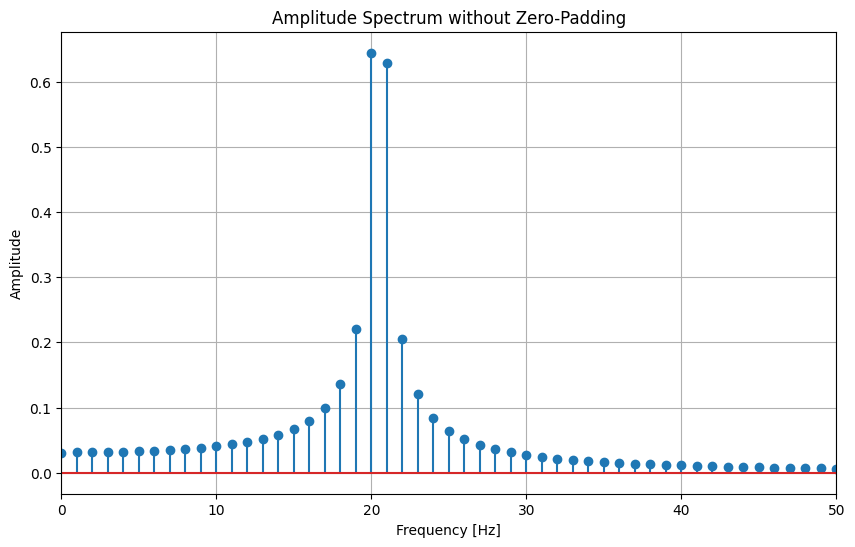

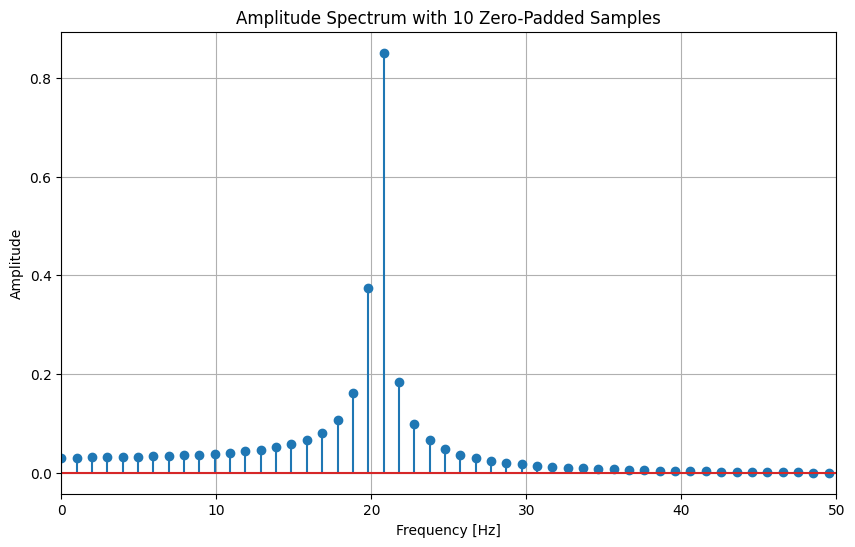

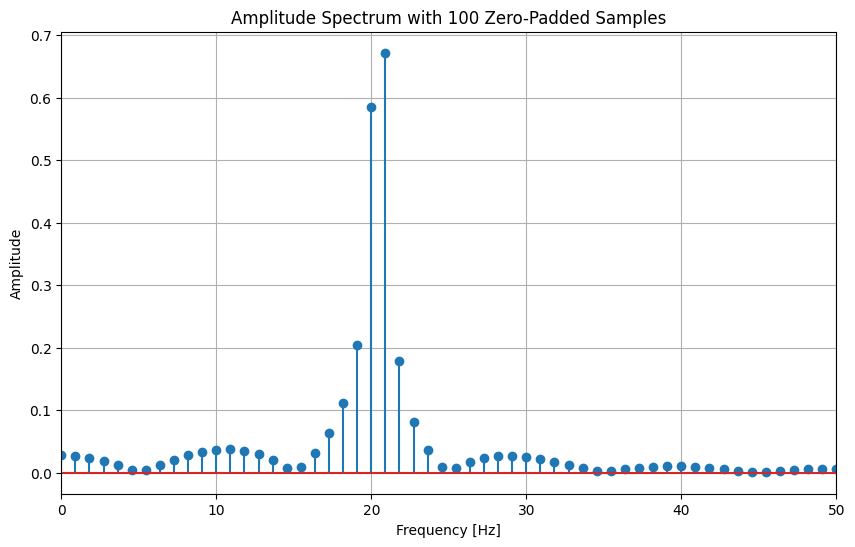

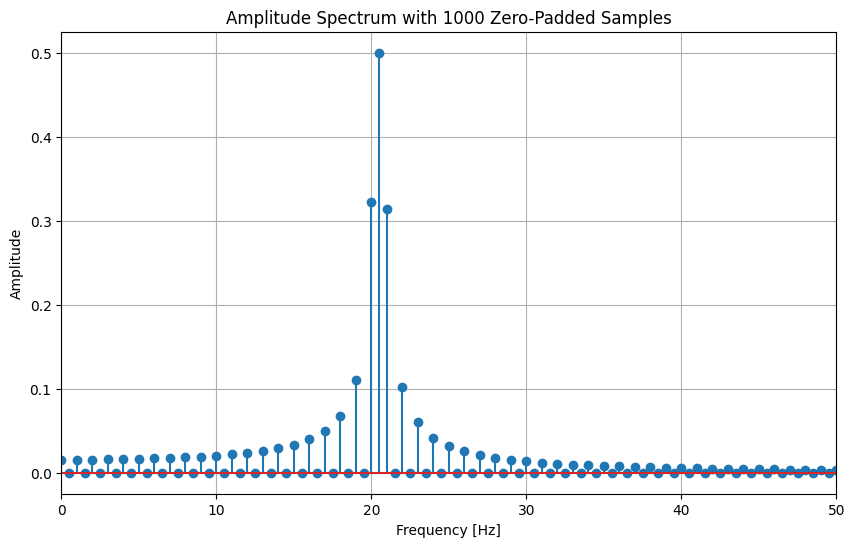

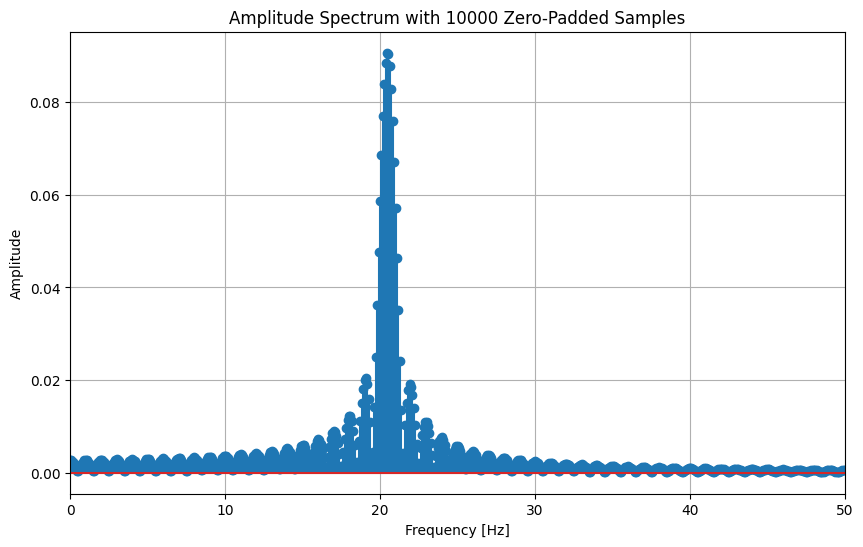

In [26]:
sampling_rate = 1000  # Hz
frequency = 20.5      # Hz
amplitude = 1         # V
duration = 1          # s

# Generate the original sinusoidal signal
time, signal = generate_sinusoidal_signal(frequency, amplitude, duration, sampling_rate)

# Plot the amplitude spectrum of the original signal
plot_amplitude_spectrum(signal, sampling_rate, 'Amplitude Spectrum without Zero-Padding')

# Amounts of zero-padding to add
zero_padding_lengths = [10, 100, 1000, 10000]

for num_zeros in zero_padding_lengths:
    # Zero-pad the signal
    padded_signal = zero_pad_signal(signal, num_zeros)
    total_samples = len(padded_signal)
    total_duration = total_samples / sampling_rate

    # Plot the amplitude spectrum
    title = f'Amplitude Spectrum with {num_zeros} Zero-Padded Samples'
    plot_amplitude_spectrum(padded_signal, sampling_rate, title)


- The spectral peak becomes sharper and more defined.
- The amplitude at 20.5 Hz becomes more accurate.
- The noise floor appears smoother due to increased data points in the FFT.

However, for true enhancement of frequency resolution, recording longer signals is necessary.

## Task 8

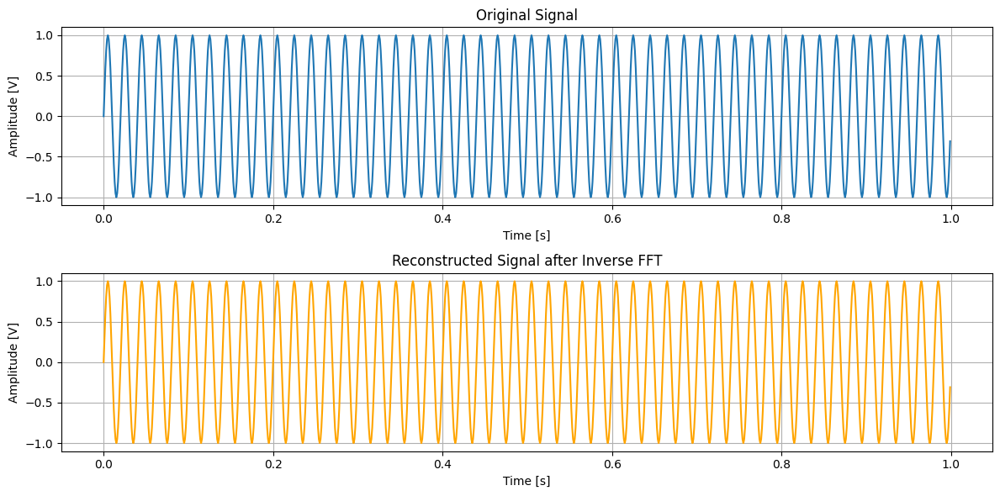

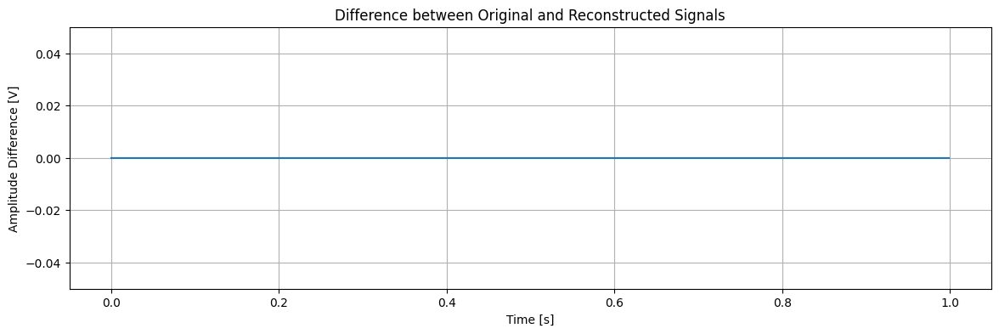

In [27]:
# Parameters for the signal
sampling_rate = 1000  # Hz
frequency = 50        # Hz
amplitude = 1         # V
duration = 1          # s

# Generate the original signal
time, original_signal = generate_sinusoidal_signal(frequency, amplitude, duration, sampling_rate)

# Perform the forward Fourier Transform
spectrum = np.fft.fft(original_signal)

# Perform the inverse Fourier Transform to reconstruct the signal
reconstructed_signal = np.fft.ifft(spectrum)

# Since the inverse FFT returns complex numbers, take the real part
reconstructed_signal = np.real(reconstructed_signal)

# Calculate the Root Mean Square Error (RMSE) between the original and reconstructed signals
rmse = np.std(original_signal - reconstructed_signal)

# Plot the original and reconstructed signals
plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
plt.plot(time, original_signal, label='Original Signal')
plt.title('Original Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude [V]')
plt.grid(True)

plt.subplot(2, 1, 2)
plt.plot(time, reconstructed_signal, label='Reconstructed Signal', color='orange')
plt.title('Reconstructed Signal after Inverse FFT')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude [V]')
plt.grid(True)

plt.tight_layout()
plt.show()

# Plot the difference between the signals
plt.figure(figsize=(14, 4))
plt.ylim(-0.05, 0.05)
plt.plot(time, original_signal - reconstructed_signal)
plt.title('Difference between Original and Reconstructed Signals')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude Difference [V]')
plt.grid(True)
plt.show()

## Task 9

In [28]:
from scipy.signal import welch

In [29]:
def plot_signal_psd(filename, sampling_rate):
    """
    Reads a signal from a file, calculates its Power Spectral Density (PSD), and plots it.

    Parameters:
    - filename (str): The name of the file containing the signal data.
    - sampling_rate (float): The sampling rate of the signal in Hz.
    """
    # Read the signal from the file
    try:
        # Assume the signal is stored in a text file with one sample per line
        signal = np.loadtxt(filename)
    except Exception as e:
        print(f"Error reading the file: {e}")
        return

    # Generate the time vector
    duration = len(signal) / sampling_rate
    time = np.linspace(0, duration, len(signal), endpoint=False)

    # Plot the signal and its amplitude spectrum using the provided function
    plot_signal(time, signal, sampling_rate, 'Original Signal')


    # Calculate the Power Spectral Density using Welch's method
    frequencies, psd = welch(signal, fs=sampling_rate, nperseg=1024)

    # Plot the PSD
    plt.figure(figsize=(13, 6))
    plt.semilogy(frequencies, psd)
    plt.title('Power Spectral Density of the Signal')
    plt.xlabel('Frequency [Hz]')
    plt.ylabel('PSD [V²/Hz]')
    plt.grid(True)
    plt.show()


In [30]:
filename = "signal_data.txt"
sampling_rate = 1000

duration = 2
t = np.linspace(0, duration, int(sampling_rate * duration), endpoint=False)
frequency = 50
signal = np.sin(2 * np.pi * frequency * t) + 0.5 * np.random.normal(size=t.shape)

np.savetxt(filename, signal)

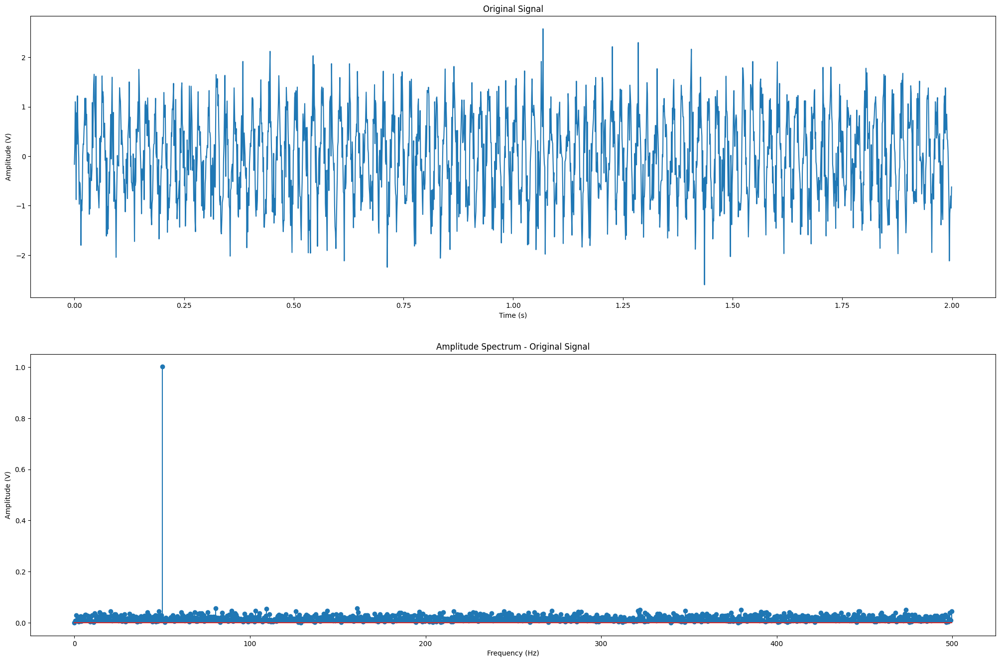

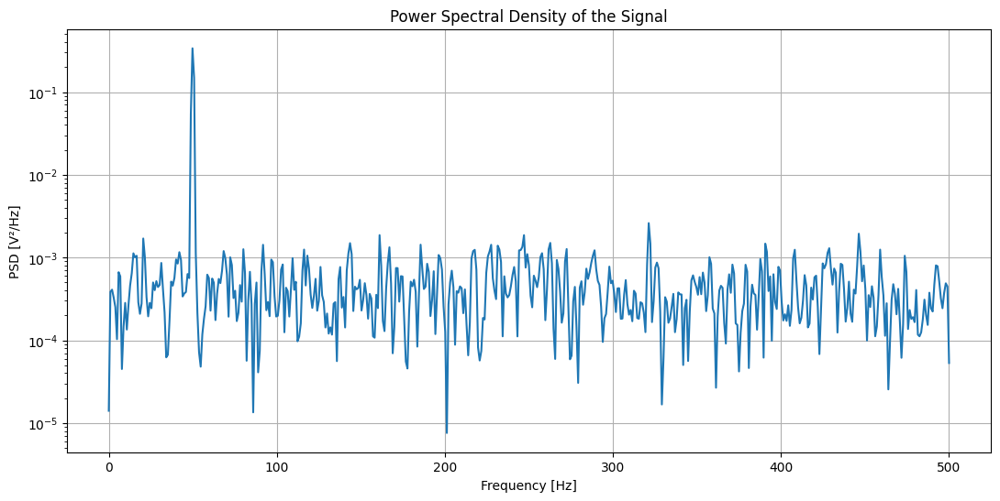

In [31]:
plot_signal_psd(filename, sampling_rate)

## Task 10

In [32]:

def plot_fragment_spectra(signal_fragment, sampling_rate, title='Signal Fragment'):
    """
    Calculates and plots the amplitude and phase spectra of a signal fragment.

    Parameters:
    - signal_fragment (numpy array): The fragment of the signal to analyze.
    - sampling_rate (float): The sampling rate of the signal in Hz.
    - title (str): Title for the plots.
    """
    N = len(signal_fragment)
    spectrum = np.fft.fft(signal_fragment)
    freq = np.fft.fftfreq(N, d=1 / sampling_rate)

    # Shift zero frequency component to the center
    spectrum = np.fft.fftshift(spectrum)
    freq = np.fft.fftshift(freq)

    # Calculate amplitude and phase spectra
    amplitude_spectrum = np.abs(spectrum) / N
    phase_spectrum = np.angle(spectrum)

    # Plot amplitude spectrum
    plt.figure(figsize=(12, 6))

    plt.subplot(2, 1, 1)
    plt.stem(freq, amplitude_spectrum)
    plt.title(f'{title} - Amplitude Spectrum')
    plt.xlabel('Frequency [Hz]')
    plt.ylabel('Amplitude')
    plt.grid(True)

    # Plot phase spectrum
    plt.subplot(2, 1, 2)
    plt.stem(freq, phase_spectrum,)
    plt.title(f'{title} - Phase Spectrum')
    plt.xlabel('Frequency [Hz]')
    plt.ylabel('Phase [Radians]')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

# Function to read the signal from a file and extract a fragment
def analyze_signal_fragment(filename, sampling_rate, start_time, end_time):
    """
    Reads a signal from a file, extracts a fragment, and plots its amplitude and phase spectra.

    Parameters:
    - filename (str): The name of the file containing the signal data.
    - sampling_rate (float): The sampling rate of the signal in Hz.
    - start_time (float): The start time of the fragment in seconds.
    - end_time (float): The end time of the fragment in seconds.
    """
    # Read the signal from the file
    try:
        # Assume the signal is stored in a text file with one sample per line
        signal = np.loadtxt(filename)
    except Exception as e:
        print(f"Error reading the file: {e}")
        return

    # Generate the time vector
    total_duration = len(signal) / sampling_rate
    time = np.linspace(0, total_duration, len(signal), endpoint=False)

    # Extract the fragment indices
    start_index = int(start_time * sampling_rate)
    end_index = int(end_time * sampling_rate)

    # Handle edge cases
    if start_index < 0 or end_index > len(signal):
        print("Invalid start or end time for the signal fragment.")
        return

    # Extract the signal fragment and corresponding time vector
    fragment = signal[start_index:end_index]
    fragment_time = time[start_index:end_index]

    # Plot the signal fragment
    plt.figure(figsize=(12, 4))
    plt.plot(fragment_time, fragment)
    plt.title('Signal Fragment')
    plt.xlabel('Time [s]')
    plt.ylabel('Amplitude')
    plt.grid(True)
    plt.show()

    # Plot amplitude and phase spectra of the fragment
    plot_fragment_spectra(fragment, sampling_rate, title='Signal Fragment')


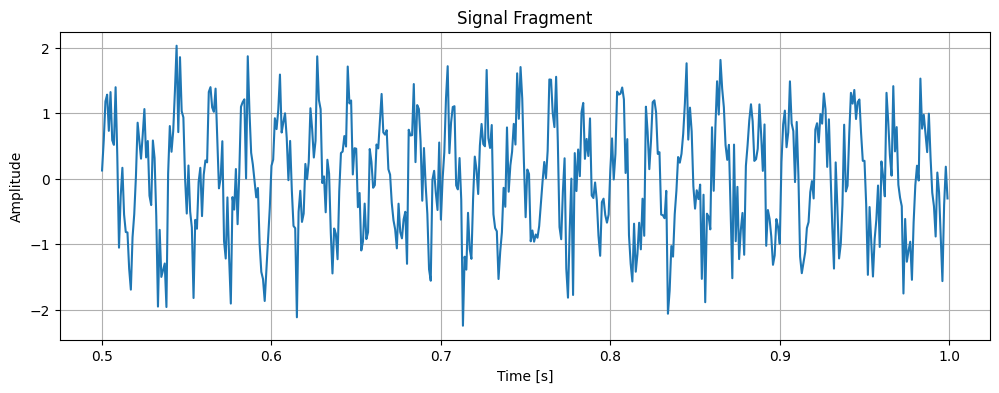

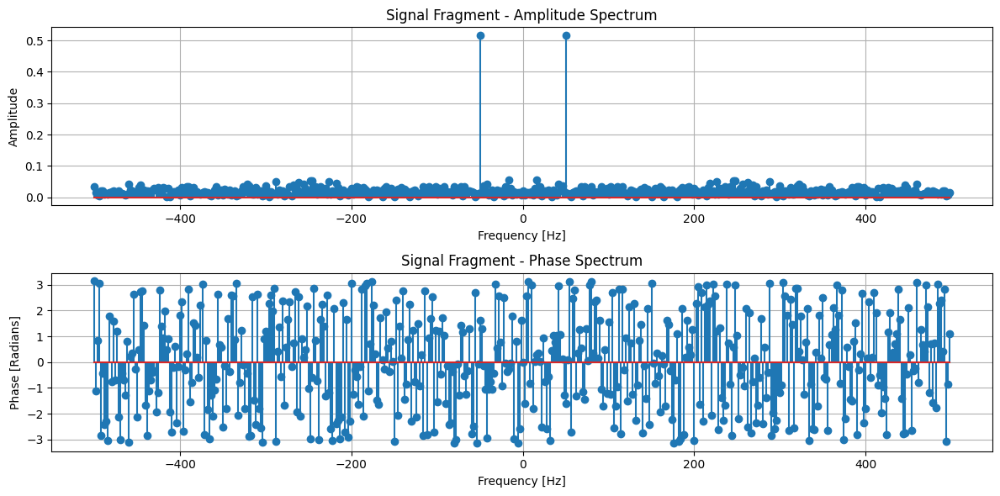

In [33]:
# Example usage with the previous signal file
filename = "signal_data.txt"  # Replace with your signal file
sampling_rate = 1000  # Hz

# Define the start and end times for the fragment (in seconds)
start_time = 0.5  # Start at 0.5 seconds
end_time = 1.0    # End at 1.0 seconds

# Analyze the signal fragment
analyze_signal_fragment(filename, sampling_rate, start_time, end_time)

As we can see, the amplitude spectrum is an even function and the phase spectrum is the odd one.

# Part 2

## Task 1

In [34]:
from scipy.signal import get_window

In [35]:

def plot_window_and_spectrum(window_type, window_length):
    """
    Generates a window of the specified type and length,
    plots the window and its amplitude spectrum.

    Parameters:
    - window_type (str): Type of the window ('bohman', 'boxcar' for rectangular).
    - window_length (int): Length of the window in samples.
    """
    # Generate the window
    window = get_window(window_type, window_length)

    # Create a time vector for plotting
    n = np.arange(window_length)

    # Compute the FFT of the window
    spectrum = np.fft.fft(window, n=4096)  # Zero-padding for better frequency resolution
    spectrum = np.fft.fftshift(spectrum)   # Shift zero frequency component to the center
    freq = np.linspace(-0.5, 0.5, len(spectrum))  # Normalized frequency axis

    # Compute the amplitude spectrum (in dB)
    amplitude_spectrum = 20 * np.log10(np.abs(spectrum) / np.max(np.abs(spectrum)))
    amplitude_spectrum = np.clip(amplitude_spectrum, -100, 0)  # Limit the dynamic range for visualization

    # Plot the window
    plt.figure(figsize=(12, 6))

    plt.subplot(2, 1, 1)
    plt.plot(n, window)
    plt.title(f'{window_type.capitalize()} Window (Length = {window_length})')
    plt.xlabel('Sample')
    plt.ylabel('Amplitude')
    plt.grid(True)

    # Plot the amplitude spectrum
    plt.subplot(2, 1, 2)
    plt.plot(freq, amplitude_spectrum)
    plt.title(f'Amplitude Spectrum of {window_type.capitalize()} Window')
    plt.xlabel('Normalized Frequency')
    plt.ylabel('Amplitude (dB)')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

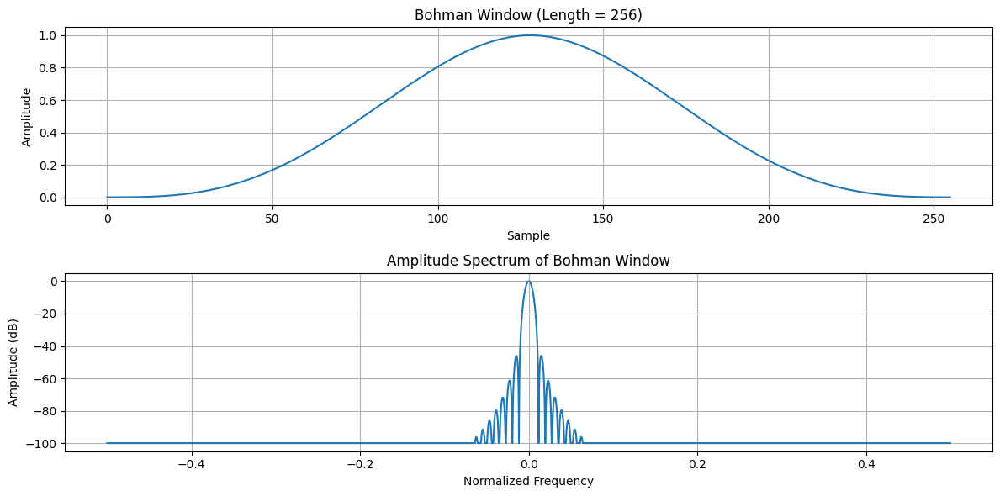

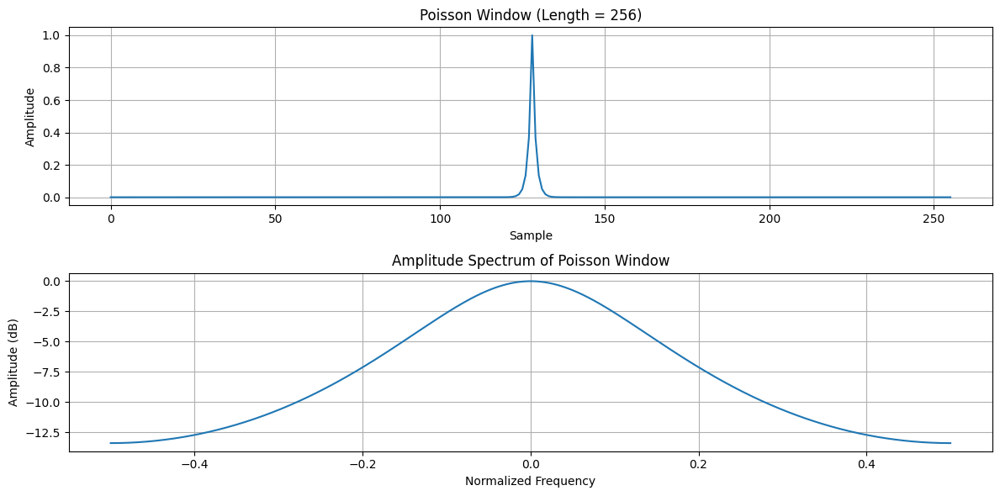

In [36]:
window_length = 256

plot_window_and_spectrum('bohman', window_length)

plot_window_and_spectrum('poisson', window_length)

## Task 2

In [37]:
def generate_sinusoidal_signal(frequency, duration, sampling_rate):
    t = np.linspace(0, duration, int(sampling_rate * duration), endpoint=False)
    signal = np.sin(2 * np.pi * frequency * t)
    return t, signal


def plot_amplitude_spectrum(signal, sampling_rate, title):
    N = len(signal)
    spectrum = np.fft.fft(signal)
    freq = np.fft.fftfreq(N, d=1 / sampling_rate)
    positive_freq_indices = freq >= 0
    freq = freq[positive_freq_indices]
    amplitude_spectrum = (2 / N) * np.abs(spectrum[positive_freq_indices])

    plt.figure(figsize=(8, 4))
    plt.stem(freq, amplitude_spectrum)
    plt.title(title)
    plt.xlabel('Frequency [Hz]')
    plt.ylabel('Amplitude')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

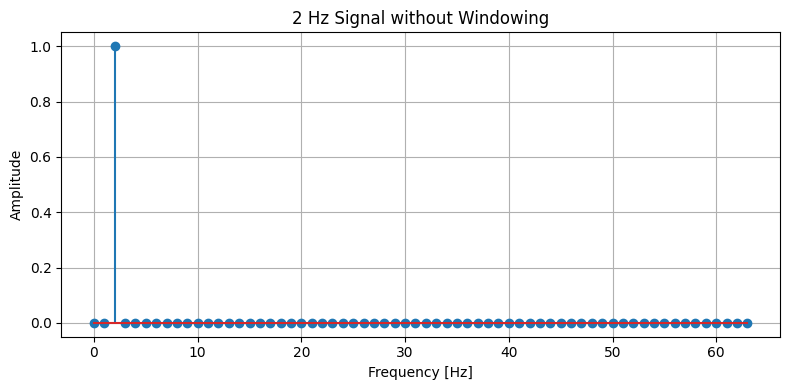

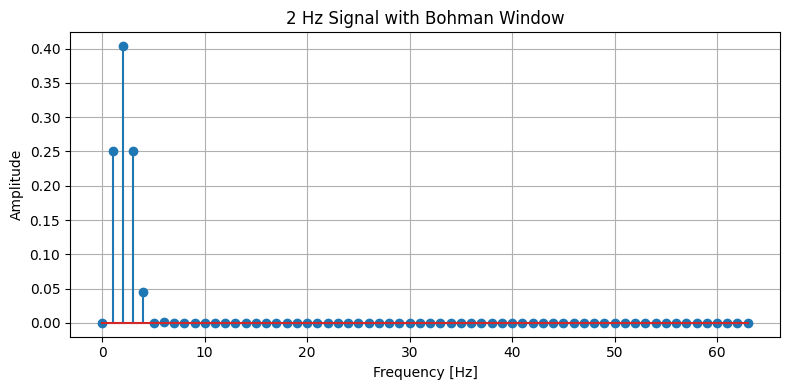

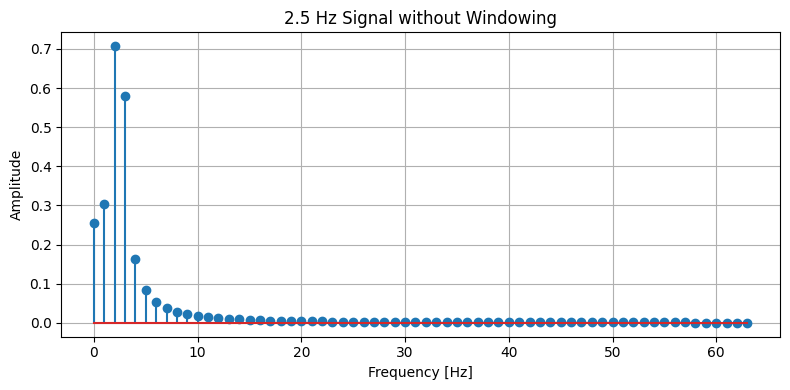

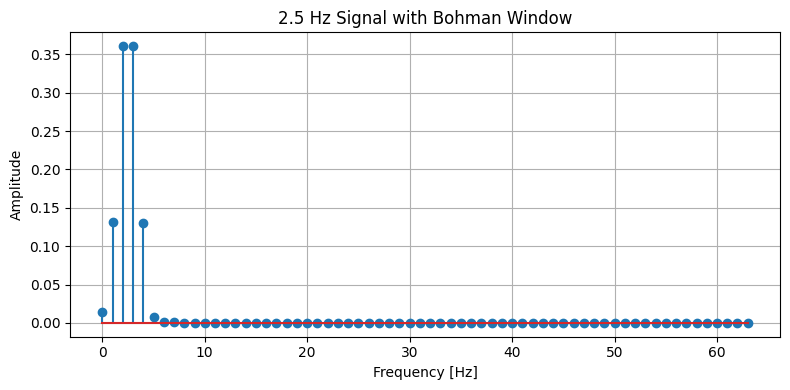

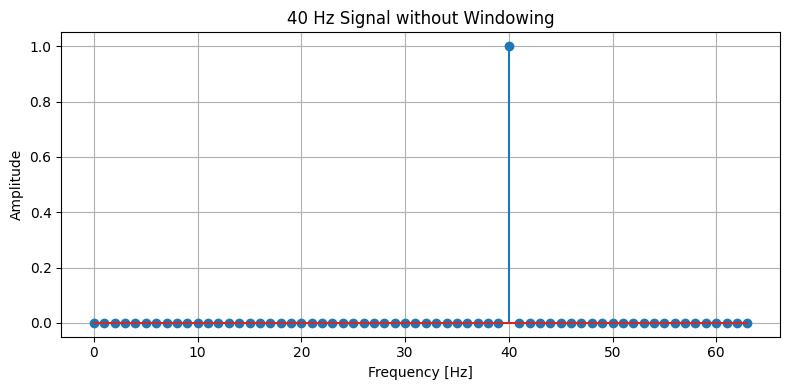

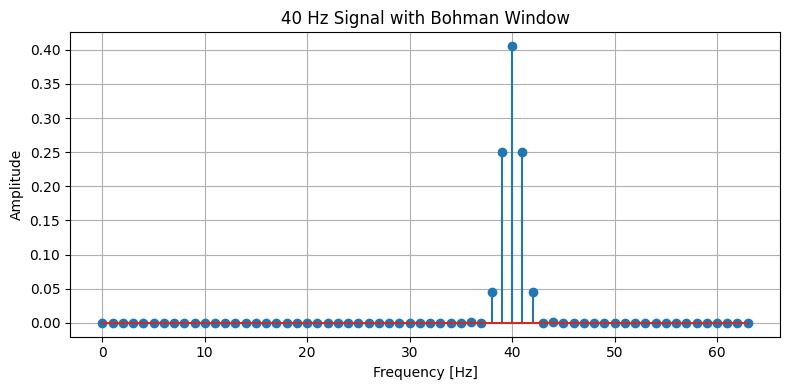

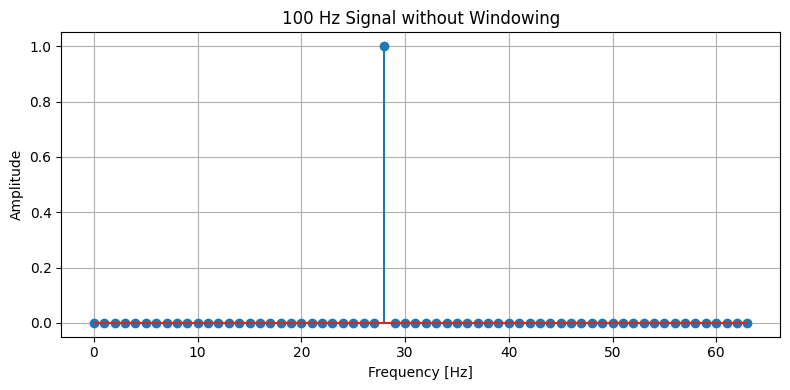

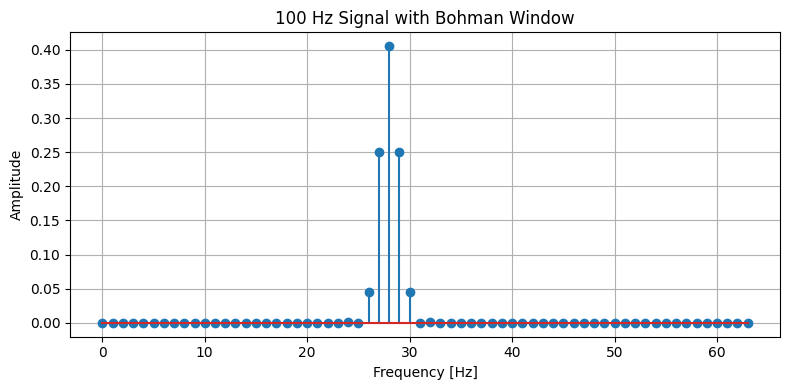

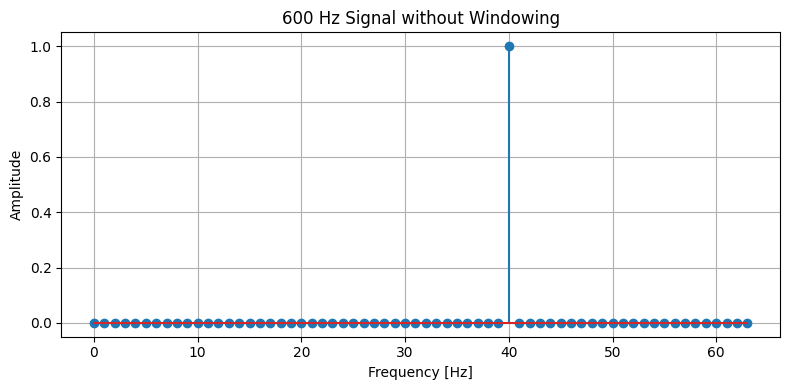

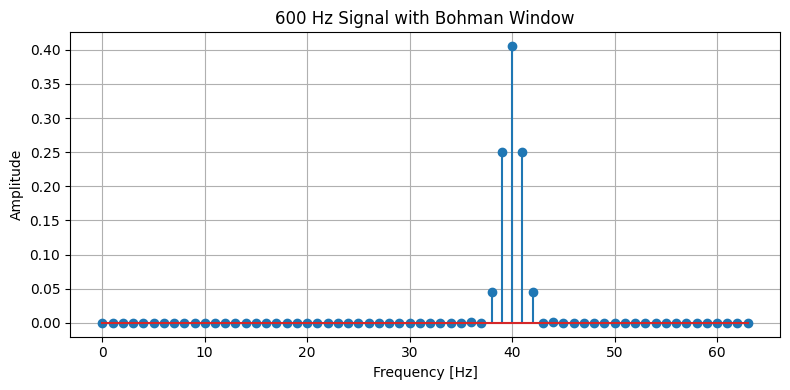

In [38]:
# Signal parameters
sampling_rate = 128  # Hz
duration = 1         # seconds
frequencies = [2, 2.5, 40, 100, 600]

# Bohman window
window_length = int(sampling_rate * duration)
bohman_window = get_window('bohman', window_length)

for freq in frequencies:
    # Generate the signal
    time, signal = generate_sinusoidal_signal(freq, duration, sampling_rate)

    # Amplitude spectrum without windowing
    plot_amplitude_spectrum(signal, sampling_rate, f'{freq} Hz Signal without Windowing')

    # Apply Bohman window
    windowed_signal = signal * bohman_window

    # Amplitude spectrum with Bohman window
    plot_amplitude_spectrum(windowed_signal, sampling_rate, f'{freq} Hz Signal with Bohman Window')


Results: as we see, windowing is beneficial for minimizing spectral leakage in *non-periodic* signals within the observation window. The trade-off is a slight loss in frequency resolution due to main lobe widening.


## Task 3

In [39]:
from scipy.signal import spectrogram, get_window

sampling_rate = 128
duration = 5
frequencies = [2, 2.5, 40, 100, 600]

window_durations = [0.01, 0.1, 0.5, 1, 2]
overlaps = [0, 10, 50, 90]


overlap_fractions = [ov / 100 for ov in overlaps]

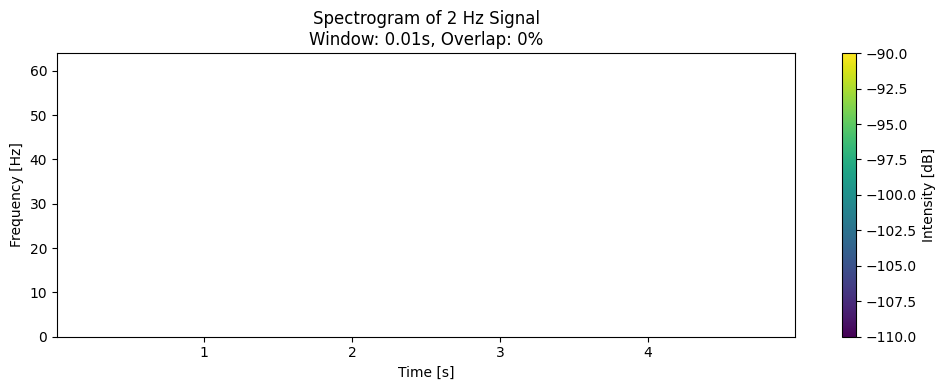

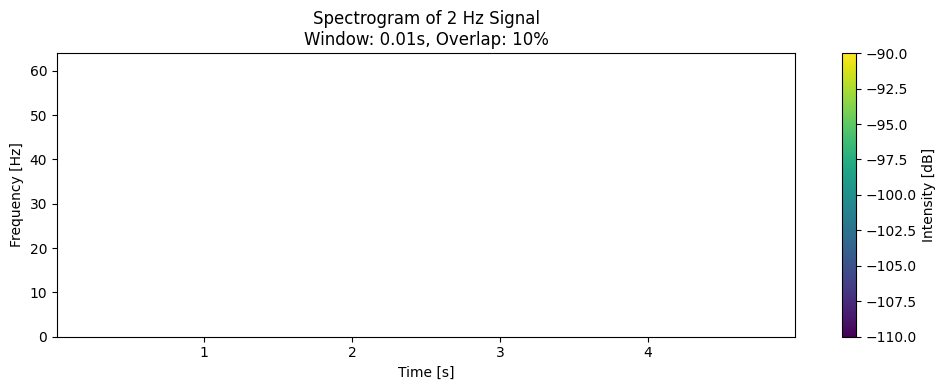

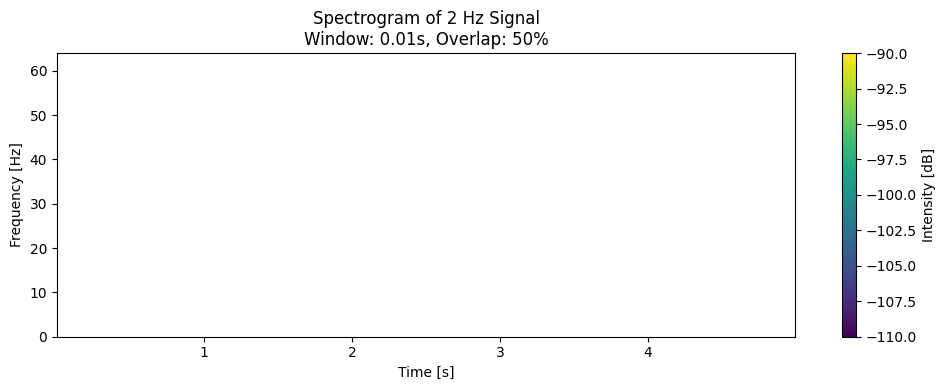

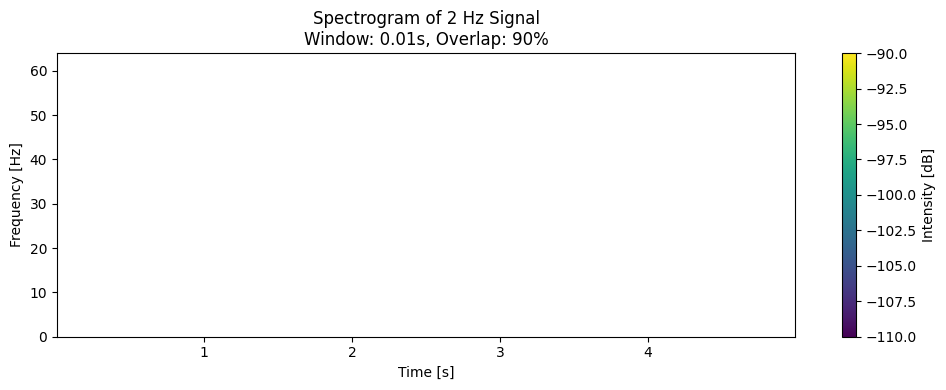

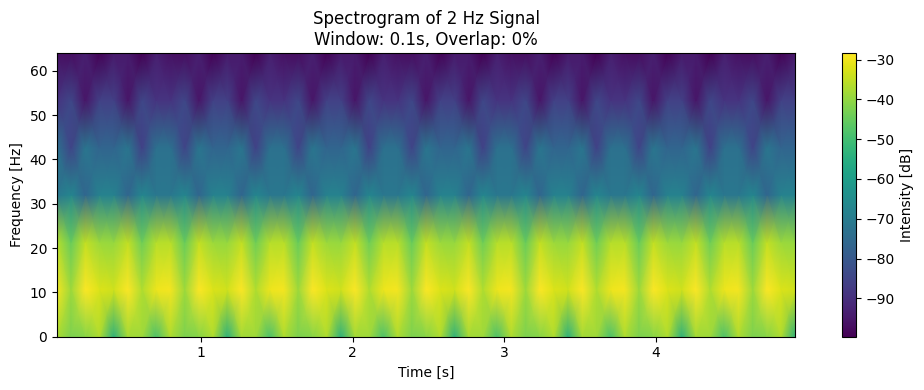

...

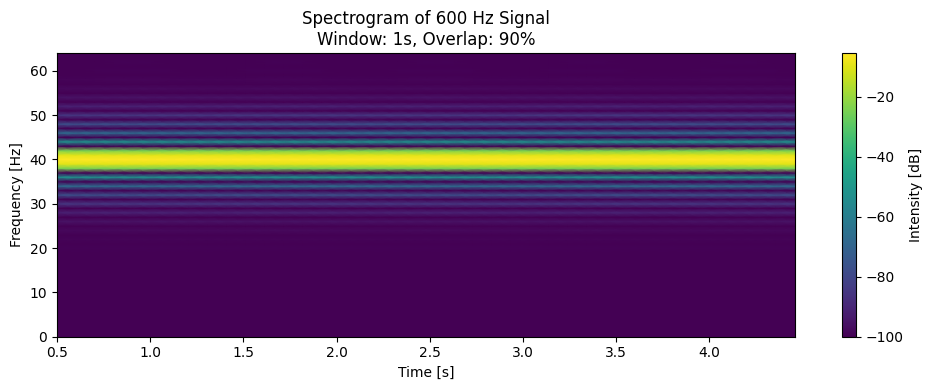

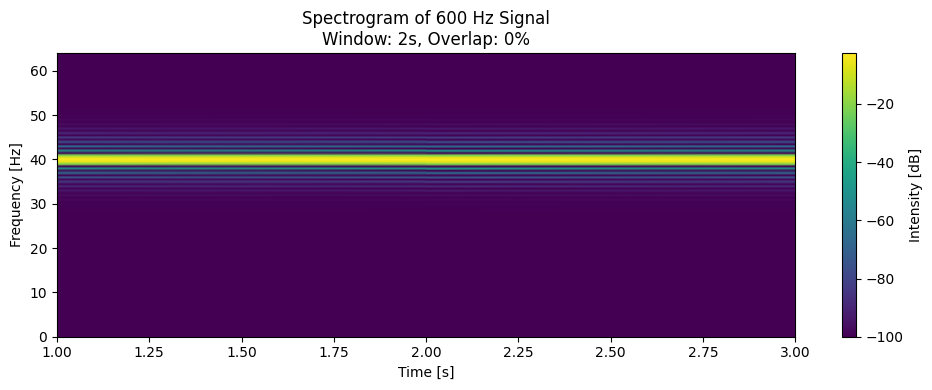

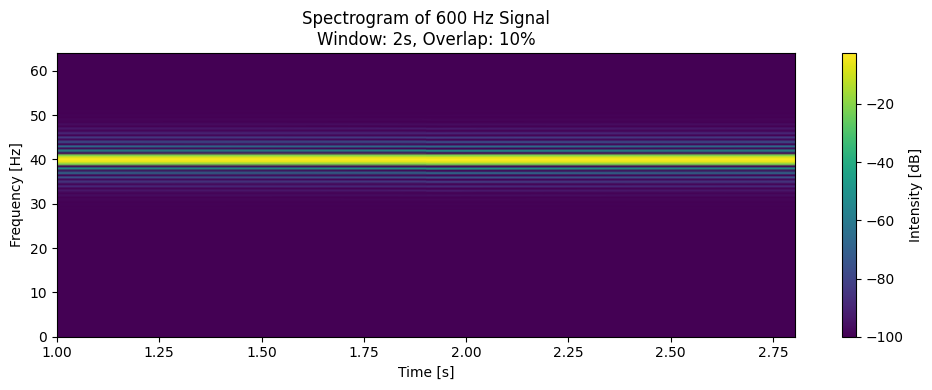

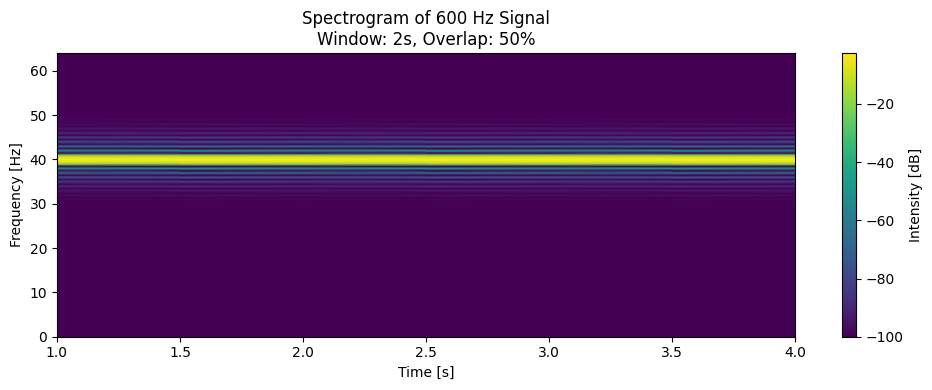

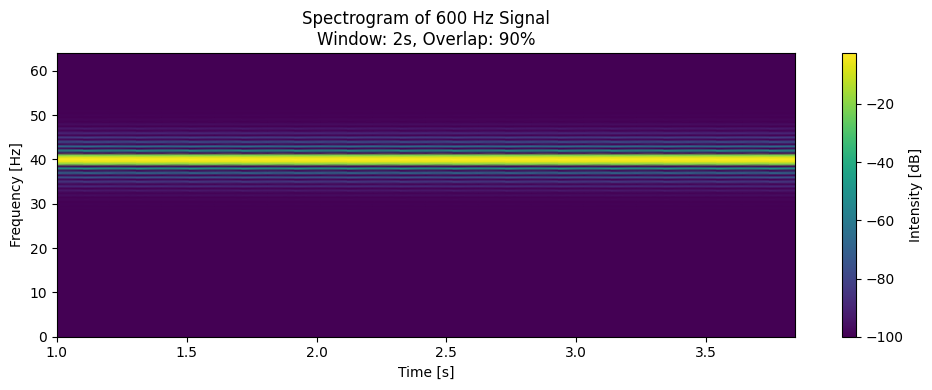

In [40]:
for freq in frequencies:
    # Generate the signal
    time, signal = generate_sinusoidal_signal(freq, duration, sampling_rate)
    
    for window_duration in window_durations:
        window_length = int(window_duration * sampling_rate)
        if window_length < 1:
            continue  # Skip if window length is less than 1 sample
        window = get_window('bohman', window_length)
        
        for overlap_fraction in overlap_fractions:
            nperseg = window_length
            noverlap = int(nperseg * overlap_fraction)
            
            f, t_spec, Sxx = spectrogram(signal, fs=sampling_rate, window=window,
                                         nperseg=nperseg, noverlap=noverlap, scaling='density')
            
            # Add a small epsilon to prevent log of zero
            epsilon = 1e-10
            Sxx = Sxx + epsilon
            
            plt.figure(figsize=(10, 4))
            plt.pcolormesh(t_spec, f, 10 * np.log10(Sxx), shading='gouraud')
            plt.colorbar(label='Intensity [dB]')
            plt.title(f'Spectrogram of {freq} Hz Signal\nWindow: {window_duration}s, Overlap: {int(overlap_fraction*100)}%')
            plt.ylabel('Frequency [Hz]')
            plt.xlabel('Time [s]')
            plt.ylim(0, sampling_rate / 2)
            plt.tight_layout()
            plt.show()


Спектрограма надає інформацію про зміну частотного складу сигналу в часі, дозволяючи бачити динамічні зміни частот у часовому контексті. Натомість, спектр за Фур'є показує частотний склад сигналу в цілому, але не дає уявлення про те, як цей склад змінюється з часом.

## Task 5

In [41]:

def plot_average_psd_over_time(signal, sampling_rate, signal_name, t1, t2, f1, f2, 
                               window_duration=0.1, overlap_fraction=0.5):
    # Calculate window length and overlap
    window_length = int(window_duration * sampling_rate)
    window = get_window('hann', window_length)
    nperseg = window_length
    noverlap = int(nperseg * overlap_fraction)

    # Compute the spectrogram
    f, t_spec, Sxx = spectrogram(signal, fs=sampling_rate, window=window, 
                                 nperseg=nperseg, noverlap=noverlap, scaling='density')

    # Find indices for the specified time and frequency ranges
    time_indices = np.where((t_spec >= t1) & (t_spec <= t2))[0]
    freq_indices = np.where((f >= f1) & (f <= f2))[0]

    # Compute the average PSD over the specified frequency range
    avg_psd_over_time = np.mean(Sxx[freq_indices, :], axis=0)

    # Plot the average PSD over the specified time range
    plt.figure(figsize=(10, 4))
    plt.plot(t_spec[time_indices], avg_psd_over_time[time_indices], label=f'Average PSD [{f1}-{f2} Hz]')
    plt.xlabel('Time [s]')
    plt.ylabel('Power Spectral Density [dB]')
    plt.title(f'Average PSD Over Time for {signal_name} in [{f1}-{f2} Hz]')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
def generate_sinusoidal_signal(frequency, T, sampling_rate, amplitude=1, endpoint=False):
    time = np.linspace(0, T, int(sampling_rate * T), endpoint=endpoint)
    signal = amplitude * np.sin(2 * np.pi * frequency * time)
    return time, signal

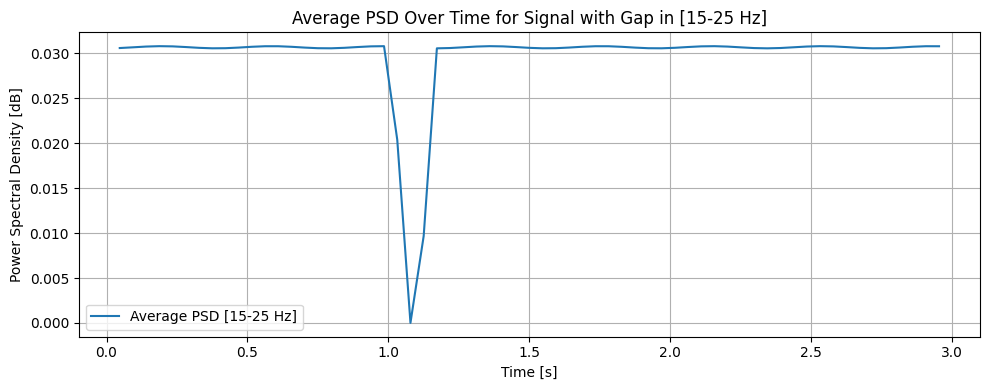

In [42]:
sampling_rate = 128
T = 3
frequency = 20
num_gap = 10

# Generate signal and add a gap for testing
time, signal = generate_sinusoidal_signal(frequency, T, sampling_rate, endpoint=True)
gap_signal = zero_gap(signal, 1.05, num_gap, sampling_rate)

# Call the function with specific parameters
plot_average_psd_over_time(gap_signal, sampling_rate, "Signal with Gap", 
                           t1=0, t2=3, f1=15, f2=25, window_duration=0.1, overlap_fraction=0.5)
